In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import numpy as np
import pandas as pd
import os 
from torch.utils.data import DataLoader, TensorDataset
import torch

In [2]:
%matplotlib notebook

In [3]:
seed = 42
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

In [4]:
num_epochs = 10000

In [5]:
# Load the conditions into a Pandas DataFrame
excel_path = './conditions.xlsx'
conditions_df = pd.read_excel(excel_path)

# Display the DataFrame to verify the contents
conditions_df


,Sample Name,Power (W),Speed (mm/s)
0,a,71,21
1,b,85,30
2,c,55,21
3,d,66,30
4,e,85,50
5,f,55,30
6,g,70,50


In [6]:
## Set up the main parameters are all in mm
spot_radius = 0.142 / 2
eta = 0.44
O_PD = 0.02

T_amb = 27.0

rho = 8000 *1e-9 #kg/(mm)^3
Cp = 500.0 #J/(kgK)
kappa = 20 * 1e-3 #W/(mmK)

T_max = 5500 #K
T_min = T_amb

T_melt = 1417

mu = 7 #mPa s
dgamma_dt = 2e-4 #N/(m * K)

In [7]:
# Set up the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

In [8]:
# Function to get CSV files in a folder
def get_csv_files_in_folder(folder_path):
    csv_file_paths = []
    for filename in os.listdir(folder_path):
        if filename.endswith('.csv'):
            full_file_path = os.path.join(folder_path, filename)
            csv_file_paths.append(full_file_path)
    return csv_file_paths

# Function to extract sample name from CSV file name
def extract_sample_name_from_csv(filename):
    # The sample name is the part of the filename before the last underscore or the file extension
    return os.path.splitext(filename)[0].split('_')[-1]


In [9]:
# Folder_path is where the CSV files are stored
folder_path = './Data/'  
csv_file_paths = get_csv_files_in_folder(folder_path)

csv_file_paths

['./Data/data_sample_g.csv',
 './Data/data_sample_d.csv',
 './Data/data_sample_c.csv',
 './Data/data_sample_a.csv',
 './Data/data_sample_e.csv',
 './Data/data_sample_f.csv',
 './Data/data_sample_b.csv']

In [10]:
# Dictionary to store summary statistics for each dataset
summary_statistics = {}

# Loop through each file path and generate summary statistics
for file_path in csv_file_paths:
    df = pd.read_csv(file_path)
    filename = os.path.basename(file_path)
    sample_name = extract_sample_name_from_csv(filename)
    
    if sample_name in conditions_df['Sample Name'].values:
        summary_statistics[sample_name] = df.describe()
    else:
        print(f"Warning: Sample name {sample_name} from {filename} not found in Excel data.")

# Display the summary statistics for verification
for sample, stats in summary_statistics.items():
    print(f"Summary statistics for sample {sample}:\n{stats}\n")


Summary statistics for sample g:
            x(um)       y(um)    Vx(mm/s)    Vy(mm/s)  Circular variance  \
count  405.000000  405.000000  405.000000  405.000000         405.000000   
mean    72.242500  -45.972500   -4.029064    4.396171           0.107504   
std    102.433491   56.819877   56.907633   63.788638           0.238721   
min    -98.512500 -137.917500 -391.747434 -433.455000           0.000000   
25%    -19.702500  -98.512500    0.000000    0.000000           0.000000   
50%     72.242500  -45.972500    0.000000    0.000000           0.000000   
75%    164.187500    6.567500    0.000000    0.000000           0.000000   
max    242.997500   45.972500  383.217565  394.050000           0.973342   

       particle numbers  
count        405.000000  
mean           0.723457  
std            1.748427  
min            0.000000  
25%            0.000000  
50%            0.000000  
75%            0.000000  
max           15.000000  

Summary statistics for sample d:
            x(

In [11]:
# Dictionary to store the actual data for each dataset
data_frames = {}

# Loop through each file path, read the data, and store both the summary statistics and the data
for file_path in csv_file_paths:
    df = pd.read_csv(file_path)
    filename = os.path.basename(file_path)
    sample_name = extract_sample_name_from_csv(filename)
    
    if sample_name in conditions_df['Sample Name'].values:
        summary_statistics[sample_name] = df.describe()
        data_frames[sample_name] = df  # Storing the actual data
    else:
        print(f"Warning: Sample name {sample_name} from {filename} not found in Excel data.")


<IPython.core.display.Javascript object>


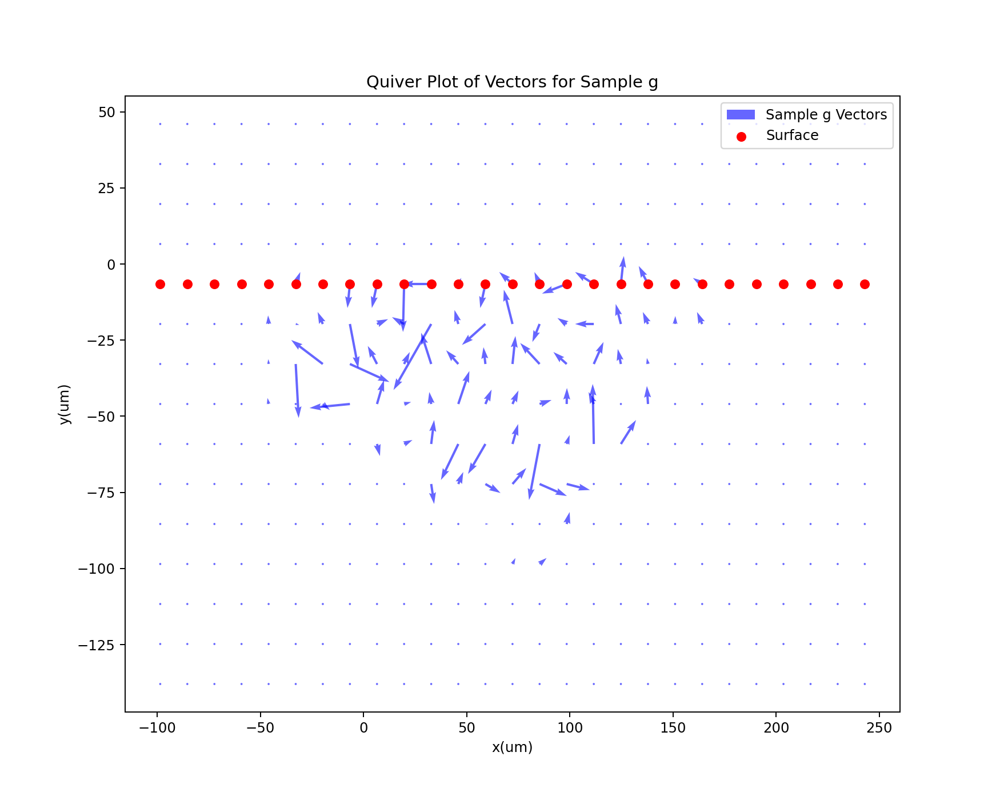

<IPython.core.display.Javascript object>


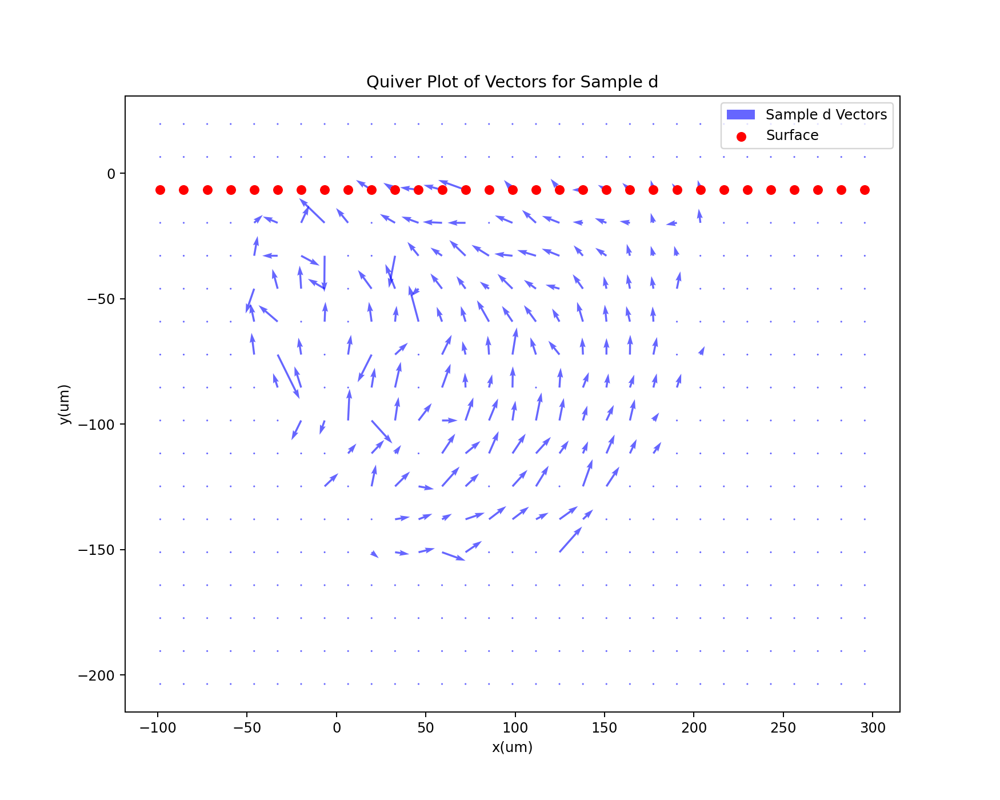

<IPython.core.display.Javascript object>


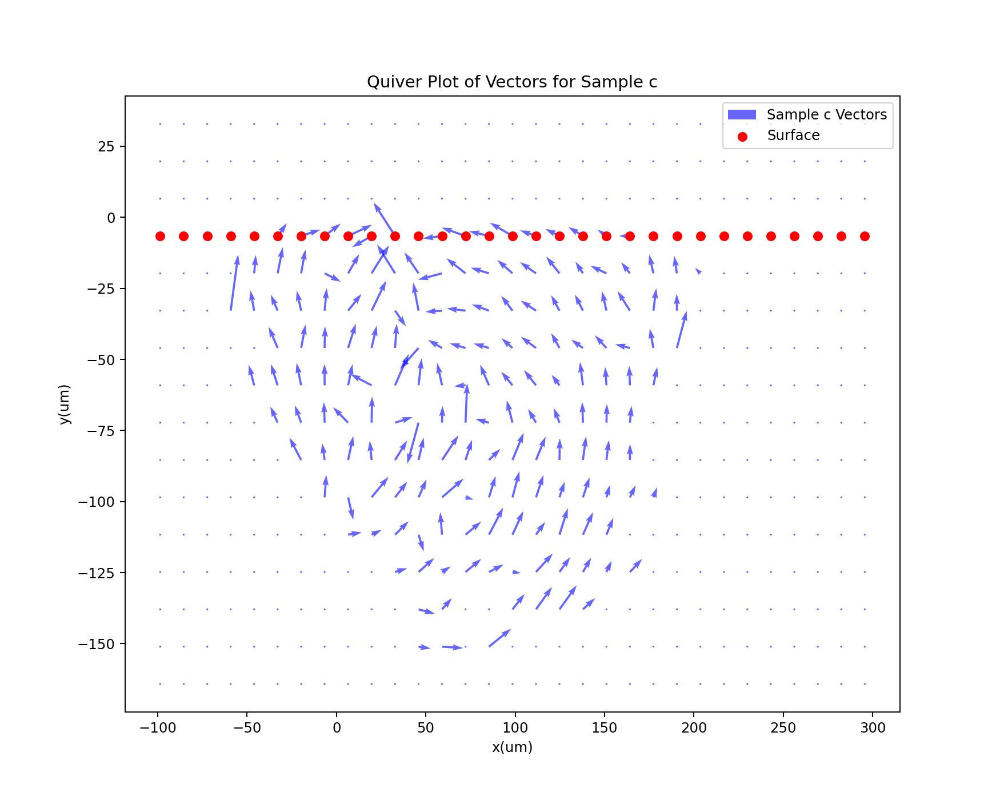

<IPython.core.display.Javascript object>


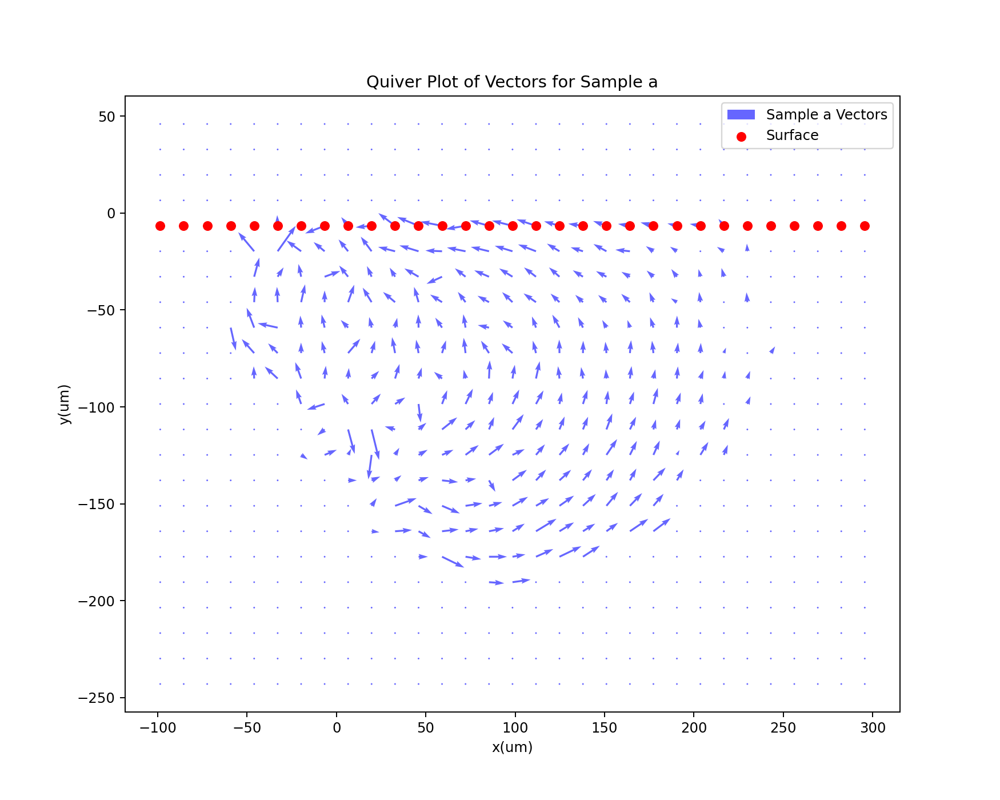

<IPython.core.display.Javascript object>


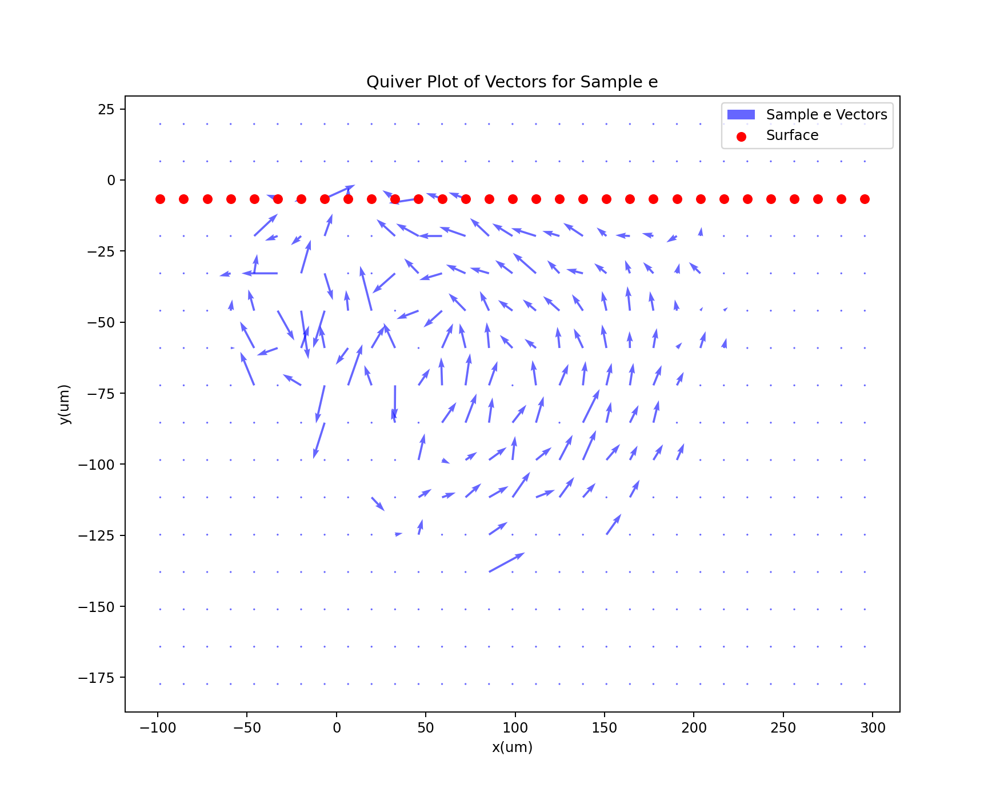

<IPython.core.display.Javascript object>


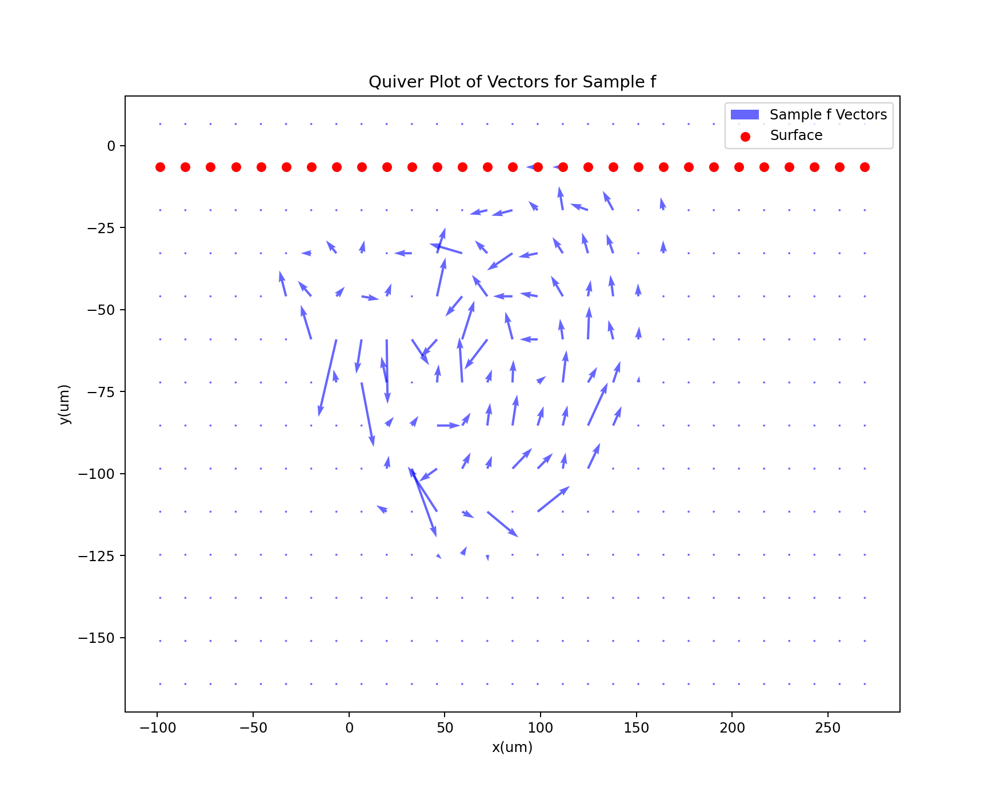

<IPython.core.display.Javascript object>


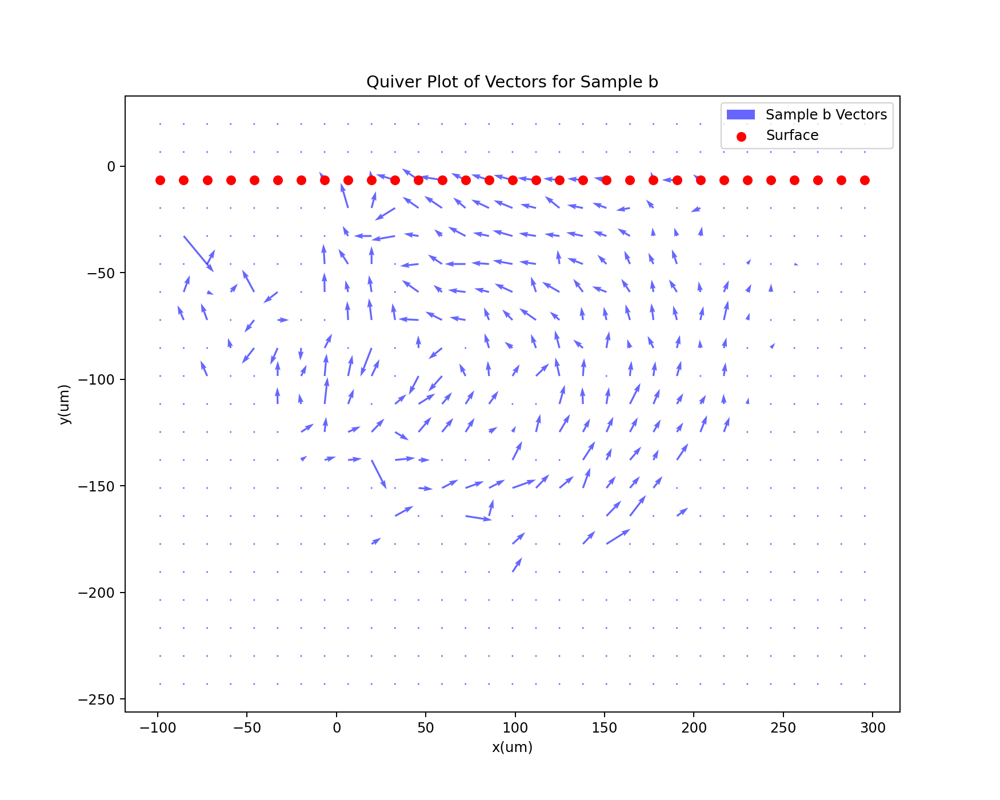

In [12]:
# Define the variable names
variables = list(summary_statistics['a'].columns)

# Loop through each sample and create quiver plots for x and y
for sample, df in data_frames.items():
    plt.figure(figsize=(10, 8))
    
    # Find the minimum absolute distance to y=0
    min_distance_to_zero = np.min(np.abs(df[variables[1]]))

    # Identify all rows where y is closest to 0
    closest_to_zero_rows = df[np.abs(df[variables[1]]) == min_distance_to_zero]

    # Filter to get only the negative y values
    closest_to_zero_rows_negative = closest_to_zero_rows[closest_to_zero_rows[variables[1]] < 0]

    # Quiver plot to show vectors; setting scale to make arrows smaller
    plt.quiver(df[variables[0]], df[variables[1]], df[variables[2]], df[variables[3]], 
               angles='xy', scale_units='xy', scale=20, color='blue', alpha=0.6, label=f'Sample {sample} Vectors')

    # Highlight the negative points closest to y=0 with red dots
    plt.scatter(closest_to_zero_rows_negative[variables[0]], closest_to_zero_rows_negative[variables[1]], 
                color='red', zorder=5, label='Surface')
    
    # Labels and title
    plt.xlabel(variables[0])
    plt.ylabel(variables[1])
    plt.title(f'Quiver Plot of Vectors for Sample {sample}')
    plt.legend()
    
    plt.show()


In [13]:
# Resolution for the grid
resolution = 13.135  # in um

# Calculate the number of points on either side of z=0
num_points_side = int(200 / resolution)

# Generate z coordinates ranging from -50 um to +50 um with the given resolution
# Make sure to include 0 in the middle
z_coordinates = torch.cat([
    torch.arange(-num_points_side * resolution, -0.1, resolution),  # Left of zero
    torch.tensor([0.0]),                                          # Zero
    torch.arange(resolution, num_points_side * resolution + 0.1, resolution)  # Right of zero
])

# Dictionary to store the 3D coordinates as PyTorch tensors for each sample
sample_coordinates = {}

# Loop through each sample and create 3D coordinates
for sample, df in data_frames.items():
    # Extract x and y coordinates from the DataFrame and convert them to PyTorch tensors
    x_coordinates = torch.tensor(df[variables[0]].values, dtype=torch.float32)
    y_coordinates = torch.tensor(df[variables[1]].values, dtype=torch.float32)
    
    # Create empty tensor to store the 3D coordinates (x, y, z) for each point
    total_points = len(x_coordinates) * len(z_coordinates)
    coords_3D = torch.zeros(total_points, 3)
    
    # Fill the 3D coordinates tensor
    index = 0
    for z in z_coordinates:
        for i in range(len(x_coordinates)):
            coords_3D[index, 0] = x_coordinates[i]
            coords_3D[index, 1] = y_coordinates[i]
            coords_3D[index, 2] = z
            index += 1
    
    # Store the 3D coordinates tensor for the sample
    sample_coordinates[sample] = coords_3D

# After generating 3D coordinates for all samples
# Loop to filter out coordinates with positive y-values
for sample in sample_coordinates.keys():
    coords_3D = sample_coordinates[sample]
    coords_filtered = coords_3D[coords_3D[:, 1] <= 0]
    sample_coordinates[sample] = coords_filtered

In [14]:
# Initialize variables to store the global maximum and minimum values for x, y, and z
global_x_max = float('-inf')
global_y_max = float('-inf')
global_z_max = float('-inf')
global_x_min = float('inf')
global_y_min = float('inf')
global_z_min = float('inf')

# Loop through each sample to find the global maximum and minimum for x, y, and z
for sample, coords in sample_coordinates.items():
    global_x_max = max(global_x_max, coords[:, 0].max())
    global_y_max = max(global_y_max, coords[:, 1].max())
    global_z_max = max(global_z_max, coords[:, 2].max())
    
    global_x_min = min(global_x_min, coords[:, 0].min())
    global_y_min = min(global_y_min, coords[:, 1].min())
    global_z_min = min(global_z_min, coords[:, 2].min())

# Calculate the global minimum and maximum values for speed and power
global_speed_min = conditions_df['Speed (mm/s)'].min()
global_speed_max = conditions_df['Speed (mm/s)'].max()
global_power_min = conditions_df['Power (W)'].min()
global_power_max = conditions_df['Power (W)'].max()

# Display the calculated global values
print(f"Global Minimum Speed: {global_speed_min} mm/s")
print(f"Global Maximum Speed: {global_speed_max} mm/s")
print(f"Global Minimum Power: {global_power_min} W")
print(f"Global Maximum Power: {global_power_max} W")
print(f"Global Maximum X: {global_x_max} um")
print(f"Global Maximum Y: {global_y_max} um")
print(f"Global Maximum Z: {global_z_max} um")
print(f"Global Minimum X: {global_x_min} um")
print(f"Global Minimum Y: {global_y_min} um")
print(f"Global Minimum Z: {global_z_min} um")


Global Minimum Speed: 21 mm/s
Global Maximum Speed: 50 mm/s
Global Minimum Power: 55 W
Global Maximum Power: 85 W
Global Maximum X: 295.5375061035156 um
Global Maximum Y: -6.567500114440918 um
Global Maximum Z: 197.02499389648438 um
Global Minimum X: -98.51249694824219 um
Global Minimum Y: -242.99749755859375 um
Global Minimum Z: -197.02499389648438 um


In [15]:
# Dictionary to store the boundary and interior coordinates as PyTorch tensors for each sample
sample_boundary_coordinates = {}
sample_interior_coordinates = {}

# Loop through each sample and separate boundary and interior points
for sample, coords_3D in sample_coordinates.items():
    x_min = coords_3D[:, 0].min()
    x_max = coords_3D[:, 0].max()
    y_min = coords_3D[:, 1].min()
    
    # Define conditions for boundary points
    cond_x_min = (coords_3D[:, 0] == x_min)
    cond_x_max = (coords_3D[:, 0] == x_max)
    cond_y_min = (coords_3D[:, 1] == y_min)
    
    # Extract boundary points
    boundary_points = coords_3D[cond_x_max | cond_y_min] # cond_x_min
    
    # Extract interior points
    interior_points = coords_3D[~(cond_x_max | cond_y_min)] # cond_x_min
    
    # Store them in dictionaries
    sample_boundary_coordinates[sample] = boundary_points
    sample_interior_coordinates[sample] = interior_points

# `sample_boundary_coordinates` contains the boundary points and
# `sample_interior_coordinates` contains the interior points for each sample.


In [16]:
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt

# # Loop through each sample and plot the 3D coordinates
# for sample in sample_coordinates.keys():
#     fig = plt.figure(figsize=(10, 8))
#     ax = fig.add_subplot(111, projection='3d')
    
#     # Scatter plot in 3D for interior points in blue
#     interior_coords = sample_interior_coordinates[sample]
#     ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], c='b', marker='o', alpha=0.2)
    
#     # Scatter plot in 3D for boundary points in red
#     boundary_coords = sample_boundary_coordinates[sample]
#     ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], c='r', marker='o', alpha=0.5)
    
#     # Labels and title
#     ax.set_xlabel('X (um)')
#     ax.set_ylabel('Y (um)')
#     ax.set_zlabel('Z (um)')
#     ax.set_title(f'3D Scatter Plot for Sample {sample} (Interior in Blue, Boundary in Red)')
    
#     plt.show()
#     break



In [17]:
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt

# # Loop through each sample and plot the 3D coordinates with velocity vectors at z=0
# for sample in sample_coordinates.keys():
#     fig = plt.figure(figsize=(10, 8))
#     ax = fig.add_subplot(111, projection='3d')
    
#     # Scatter plot in 3D for interior points in blue
#     interior_coords = sample_interior_coordinates[sample]
#     ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], c='b', marker='o', alpha=0.1, label='Interior Coordinates')
    
#     # Scatter plot in 3D for boundary points in red
#     boundary_coords = sample_boundary_coordinates[sample]
#     ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], c='r', marker='o', alpha=0.5, label='Boundary Coordinates')
    
#     # Extract data for the sample
#     df_sample = data_frames[sample]
#     x_values = df_sample[variables[0]].values
#     y_values = df_sample[variables[1]].values
#     vx_values = df_sample[variables[2]].values
#     vy_values = df_sample[variables[3]].values
    
#     # Quiver plot for fluid velocity vectors at z=0
#     ax.quiver(x_values, y_values, 0, vx_values, vy_values, 0, color='g', length=0.1, arrow_length_ratio=0.2, label='Velocity Vectors at z=0')
    
#     # Labels and title
#     ax.set_xlabel('X (um)')
#     ax.set_ylabel('Y (um)')
#     ax.set_zlabel('Z (um)')
#     ax.set_title(f'3D Scatter Plot with Velocity Vectors for Sample {sample}')
#     ax.legend()
    
#     plt.show()
#     break


In [18]:
def heat_source(coords: torch.Tensor, power: torch.Tensor, spot_radius: torch.Tensor, eta: torch.Tensor) -> torch.Tensor:
    """
    Computes the heat source based on the input values 
    of x, y, z, power, spot_radius, eta_bulk, eta_powder and O_PD.
    
    Parameters:
        coordinates (torch.Tensor): tensor of coordinate values
        power (torch.Tensor): power value
        eta (torch.Tensor): absorption 
        spot_radius (torch.Tensor): spot radius value (1/e)
    
    Returns:
        Q (torch.Tensor): tensor of heat flux
    """
    x, y, z = coords[:, 0], coords[:, 1], coords[:, 2]
    power = power.view(-1)
    
    # Compute the Gaussian heat source
    Q = 2 * (eta * power) / (torch.pi * spot_radius ** 2 * O_PD * torch.sqrt(torch.tensor(torch.pi))) * torch.exp(
        -((x ** 2) / (spot_radius ** 2) + (z ** 2) / (spot_radius ** 2) + (y ** 2) / (O_PD ** 2)))
    
    # Mask to zero out Q values where y is non-negative
    mask = (y >= 0)
    Q[mask] = 0
    
    return Q


In [19]:
sample_interior_coordinates[sample][:, 1].max()

tensor(-6.5675)

<IPython.core.display.Javascript object>


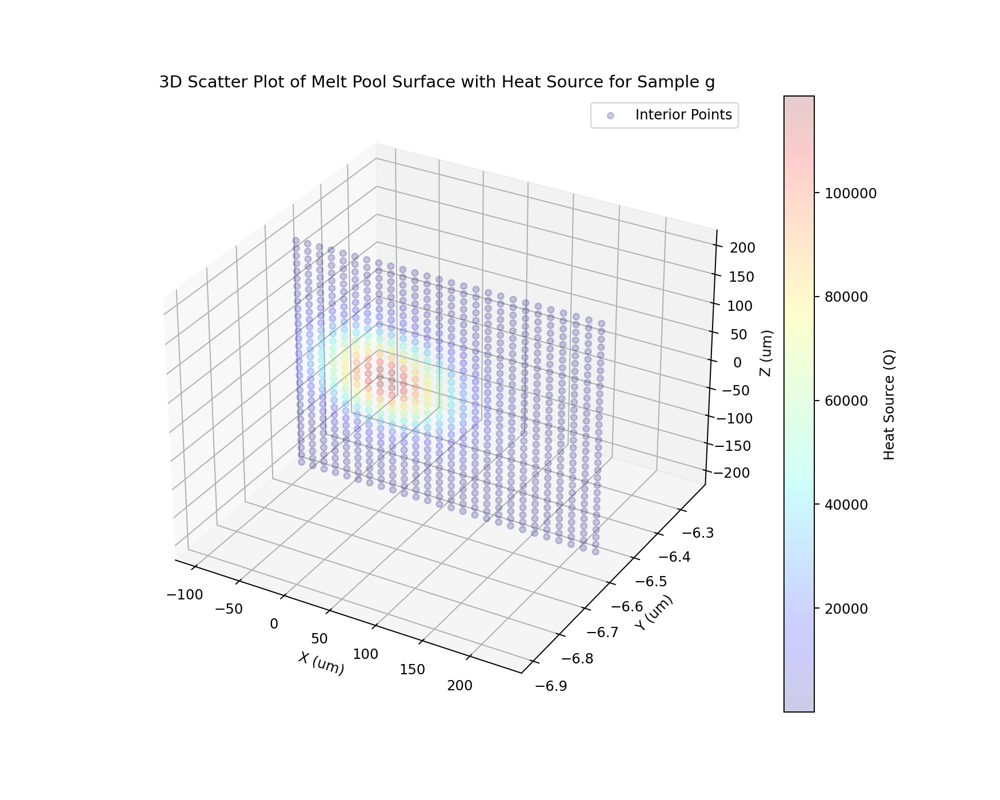

In [20]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Parameters for heat source (convert them to PyTorch tensors)
power = torch.tensor(global_power_max)

# Loop through each sample and plot the 3D coordinates with heat source
for sample in sample_coordinates.keys():
    
    
    filtered_coords = sample_interior_coordinates[sample][sample_interior_coordinates[sample][:, 1] == sample_interior_coordinates[sample][:, 1].max(), :]
    
    # Compute heat source for the boundary and interior coordinates
    Q_values = heat_source(filtered_coords / 1000, power, spot_radius, eta)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Scatter plot in 3D colored by heat source values for interior points
    scatter_interior = ax.scatter(filtered_coords[:, 0], filtered_coords[:, 1], filtered_coords[:, 2], 
                                  c=Q_values, cmap=cm.jet, marker='o', alpha=0.2, label='Interior Points')
 
    
    # Add a color bar to indicate heat source values
    cbar = plt.colorbar(scatter_interior)
    cbar.set_label('Heat Source (Q)')
    

    # Labels and title
    ax.set_xlabel('X (um)')
    ax.set_ylabel('Y (um)')
    ax.set_zlabel('Z (um)')
    ax.set_title(f'3D Scatter Plot of Melt Pool Surface with Heat Source for Sample {sample}')
    ax.legend()
    
    plt.show()
    break


In [21]:
import torch
import torch.nn as nn

class MultiResidualTempFieldNN(nn.Module):
    def __init__(self, T_amb):
        super(MultiResidualTempFieldNN, self).__init__()
        n_hidden = 3700

        # Define wide but shallow layers
        self.layer1 = nn.Linear(5, n_hidden)
        self.layer2 = nn.Linear(n_hidden, n_hidden)
        self.layer_out = nn.Linear(n_hidden, 1)

        # Layers for identity transformations
        self.identity1 = nn.Linear(5, n_hidden)  # Matching input dimensions to layer1 output
        self.identity2 = nn.Linear(n_hidden, n_hidden)  # Matching layer1 output to layer2 output

        # Initialize the bias of the output layer to T_amb
        nn.init.constant_(self.layer_out.bias, T_amb)

    def forward(self, x):
        # First layer followed by activation
        x1 = self.layer1(x)
        x1_act = torch.tanh(x1)

        # First residual connection
        identity1_out = self.identity1(x)
        x1_res = x1_act * identity1_out

        # Second layer followed by activation
        x2 = self.layer2(x1_res)
        x2_act = torch.tanh(x2)

        # Second residual connection
        identity2_out = self.identity2(x1_res)
        x2_res = x2_act * identity2_out

        # Output layer
        x_out = self.layer_out(x2_res)
        
        return x_out


# Fluid Flow Neural Network
class FluidFlowNN(nn.Module):
    def __init__(self):
        super(FluidFlowNN, self).__init__()
        self.layer1 = nn.Linear(5, 2048*4)
        self.layer2 = nn.Linear(2048*4, 512*4)
        self.layer_out = nn.Linear(512*4, 3)
        self.silu = nn.SiLU()
        
    def forward(self, x):
        x = self.layer1(x)
        x = self.silu(x)
        x = self.layer2(x)
        x = self.silu(x)
        x = self.layer_out(x)
        return x

# Instantiate the neural networks
#temp_net = TempFieldNN()
#fluid_net = FluidFlowNN()

# # Print the architectures
# print("Temperature Field Neural Network architecture:")
# print(temp_net)
# print("\nFluid Flow Neural Network architecture:")
# print(fluid_net)


Next steps: 
- write a function to normalize the network input
- output can stay unnormalized 
- write function to generate boundary data at random 
- remember to use cross-validation
- write custom loss 

In [22]:
def normalize_tensor(tensor, min_val, max_val):
    """
    Normalize a tensor to range [-1, 1].

    Parameters:
        tensor (torch.Tensor): The tensor to normalize.
        min_val (float): The minimum value for normalization.
        max_val (float): The maximum value for normalization.

    Returns:
        torch.Tensor: The normalized tensor.
    """
    return ((tensor - min_val) / (max_val - min_val)) * 2 - 1

In [23]:
def normalize_coordinates(tensor, x_min, x_max, y_min, y_max, z_min, z_max):
    normalized_tensor = tensor.clone()  # Create a new tensor
    normalized_tensor[:, 0] = ((tensor[:, 0] - x_min) / (x_max - x_min)) * 2 - 1  # Normalize x
    normalized_tensor[:, 1] = ((tensor[:, 1] - y_min) / (y_max - y_min)) * 2 - 1  # Normalize y
    normalized_tensor[:, 2] = ((tensor[:, 2] - z_min) / (z_max - z_min)) * 2 - 1  # Normalize z
    return normalized_tensor


In [24]:
from torch.utils.data import DataLoader, TensorDataset

# Create a list of sample identifiers
sample_identifiers = list(sample_coordinates.keys())
sample_identifiers

['g', 'd', 'c', 'a', 'e', 'f', 'b']

In [25]:
from torch.utils.data import DataLoader, Dataset, TensorDataset
import torch

# Custom Dataset to handle sample-specific data
class SampleSpecificDataset(Dataset):
    def __init__(self, sample_data_list):
        self.data_list = sample_data_list
    
    def __len__(self):
        return len(self.data_list)
    
    def __getitem__(self, index):
        return self.data_list[index]

def create_data_loader(exclude_sample, x_max, x_min, y_max, y_min, z_max, z_min, 
                       sample_coordinates, sample_boundary_coordinates, sample_interior_coordinates, 
                       conditions_df, data_frames, verbose=False):
    
    if (verbose):
        print("Starting the create_data_loader function...")
    
    training_data_list = []
    validation_data_list = []
    
    if (verbose):
        print("Initialized empty lists for storing sample-specific data.")
    
    for sample in sample_coordinates.keys():
        
        if (verbose):
            print('----'*8)
            print(f"Processing sample: {sample}")
        
        # Extract and normalize conditions
        condition_row = conditions_df[conditions_df['Sample Name'] == sample]
        speed = condition_row['Speed (mm/s)'].values[0]
        power = condition_row['Power (W)'].values[0]
        
        if (verbose):
            print(f"Extracted conditions - Speed: {speed}, Power: {power}")
        
        norm_speed = normalize_tensor(torch.tensor([speed]), global_speed_min, global_speed_max)
        norm_power = normalize_tensor(torch.tensor([power]), global_power_min, global_power_max)
        
        if (verbose):
            print(f"Normalized conditions - Speed: {norm_speed.item()}, Power: {norm_power.item()}")
        
        # Capture min and max values before normalization for boundary coordinates
        boundary_min_before = sample_boundary_coordinates[sample].min(dim=0).values
        boundary_max_before = sample_boundary_coordinates[sample].max(dim=0).values
        if (verbose):
            print(f"Boundary Min values before normalization: {boundary_min_before}")
        if (verbose):
            print(f"Boundary Max values before normalization: {boundary_max_before}")

        # Normalize coordinates
        boundary_coords = normalize_coordinates(sample_boundary_coordinates[sample], x_min, x_max, y_min, y_max, z_min, z_max)
        interior_coords = normalize_coordinates(sample_interior_coordinates[sample], x_min, x_max, y_min, y_max, z_min, z_max)

        # Capture min and max values after normalization for boundary coordinates
        boundary_min_after = boundary_coords.min(dim=0).values
        boundary_max_after = boundary_coords.max(dim=0).values
        if (verbose):
            print(f"Boundary Min values after normalization: {boundary_min_after}")
        if (verbose):
            print(f"Boundary Max values after normalization: {boundary_max_after}")
        
        if (verbose):
            print(f"Normalized coordinates. Shape (Boundary): {boundary_coords.shape}, Shape (Interior): {interior_coords.shape}")
        
        # Create condition tensors by repeating the speed and power values
        num_boundary_coords = len(boundary_coords)
        num_interior_coords = len(interior_coords)
        
        condition_boundary = torch.stack([norm_speed.repeat(num_boundary_coords), norm_power.repeat(num_boundary_coords)], dim=1)
        condition_interior = torch.stack([norm_speed.repeat(num_interior_coords), norm_power.repeat(num_interior_coords)], dim=1)
        
        # Concatenate coordinates and conditions
        boundary_data = torch.cat([boundary_coords, condition_boundary], dim=1)
        interior_data = torch.cat([interior_coords, condition_interior], dim=1)
        
        # Append to sample-specific data list
        if sample == exclude_sample:
            validation_data_list.append({'boundary': boundary_data, 'interior': interior_data, 'sample': sample})
        else:
            training_data_list.append({'boundary': boundary_data, 'interior': interior_data, 'sample': sample})
    
    # Create PyTorch Data Loaders using custom dataset
    train_loader = DataLoader(SampleSpecificDataset(training_data_list), batch_size=1, shuffle=True)
    val_loader = DataLoader(SampleSpecificDataset(validation_data_list), batch_size=1, shuffle=False)
    
    if (verbose):
        print("Created PyTorch Data Loaders.")
    
    return train_loader, val_loader


In [26]:
conditions_df['Sample Name'][0]

'a'

In [27]:
# Create Data Loaders
train_loader, val_loader = create_data_loader(conditions_df['Sample Name'][0], global_x_max, global_x_min, global_y_max, 
                                              global_y_min, global_z_max, global_z_min,
                                              sample_coordinates, sample_boundary_coordinates,
                                              sample_interior_coordinates, conditions_df, data_frames)

In [28]:
def unnormalize_tensor(tensor, min_val, max_val):
    """
    Unnormalize a tensor from range [-1, 1] to original range.

    Parameters:
        tensor (torch.Tensor): The tensor to unnormalize.
        min_val (float): The minimum value for unnormalization.
        max_val (float): The maximum value for unnormalization.

    Returns:
        torch.Tensor: The unnormalized tensor.
    """
    return ((tensor + 1) / 2) * (max_val - min_val) + min_val

def unnormalize_coordinates(tensor, x_min, x_max, y_min, y_max, z_min, z_max):
    """
    Unnormalize the x, y, and z coordinates in a tensor to the original range.

    Parameters:
        tensor (torch.Tensor): The tensor to unnormalize. Shape: [N, 3]
        x_min, x_max (float): The minimum and maximum values for the x-coordinate.
        y_min, y_max (float): The minimum and maximum values for the y-coordinate.
        z_min, z_max (float): The minimum and maximum values for the z-coordinate.

    Returns:
        torch.Tensor: The unnormalized tensor. Shape: [N, 3]
    """
    unnormalized_tensor = tensor.clone()  # Create a new tensor
    unnormalized_tensor[:, 0] = ((tensor[:, 0] + 1) * (x_max - x_min) / 2) + x_min  # Unnormalize x
    unnormalized_tensor[:, 1] = ((tensor[:, 1] + 1) * (y_max - y_min) / 2) + y_min  # Unnormalize y
    unnormalized_tensor[:, 2] = ((tensor[:, 2] + 1) * (z_max - z_min) / 2) + z_min  # Unnormalize z
    
    return unnormalized_tensor


<IPython.core.display.Javascript object>


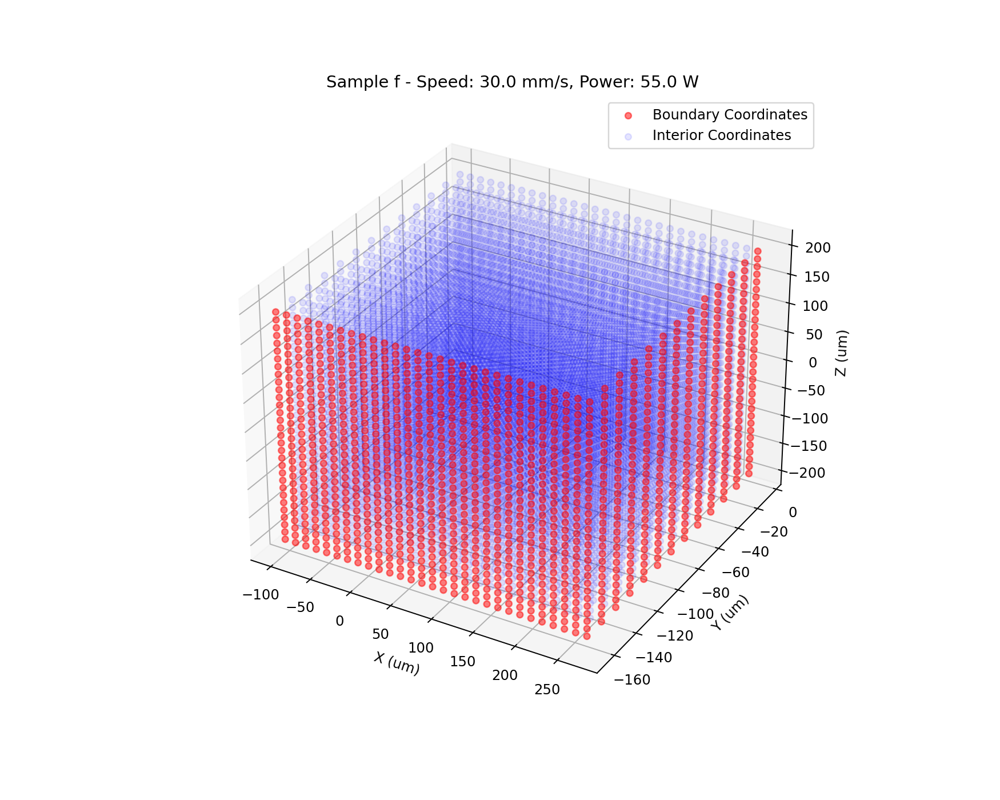

<IPython.core.display.Javascript object>


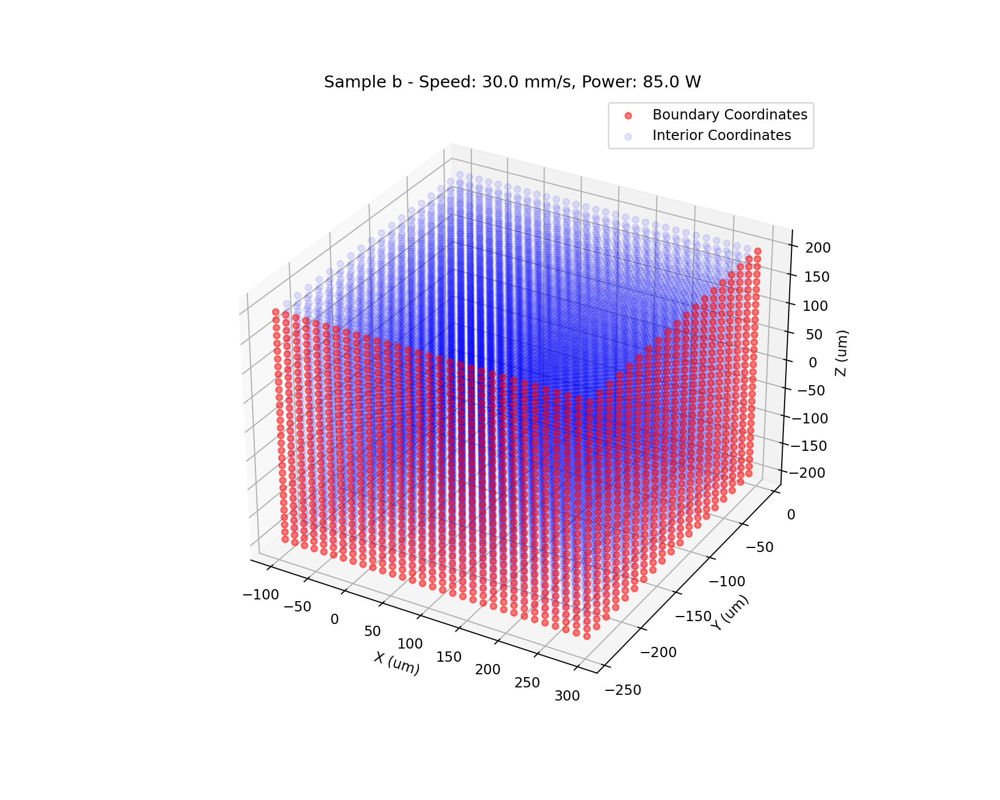

<IPython.core.display.Javascript object>


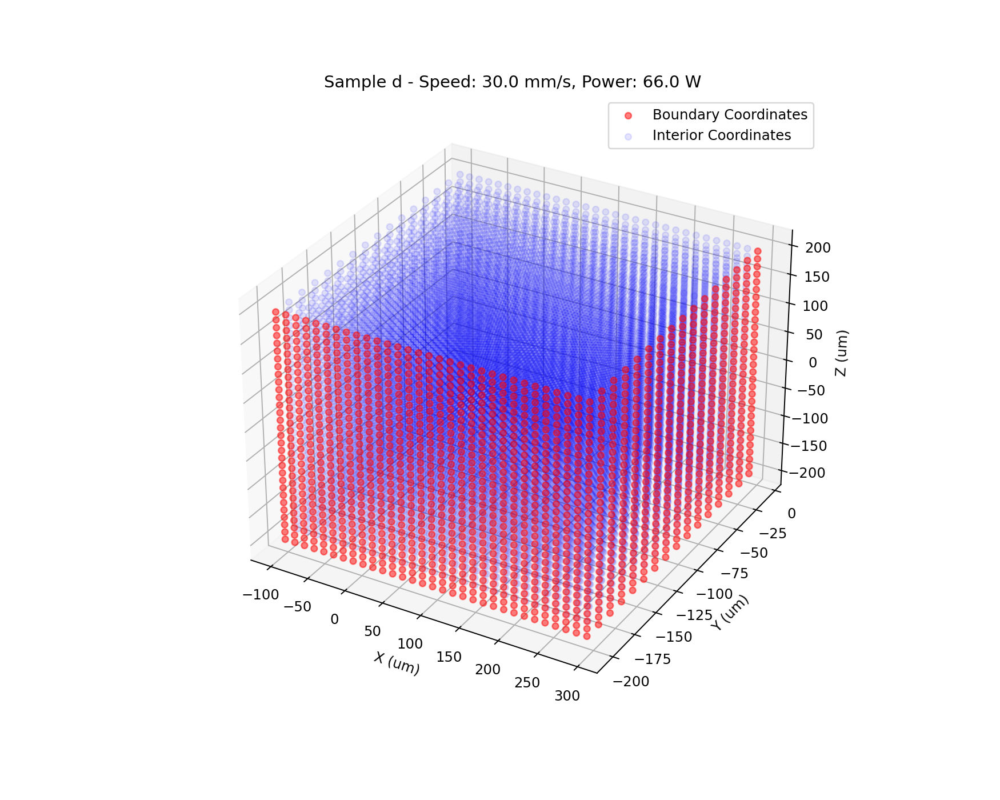

<IPython.core.display.Javascript object>


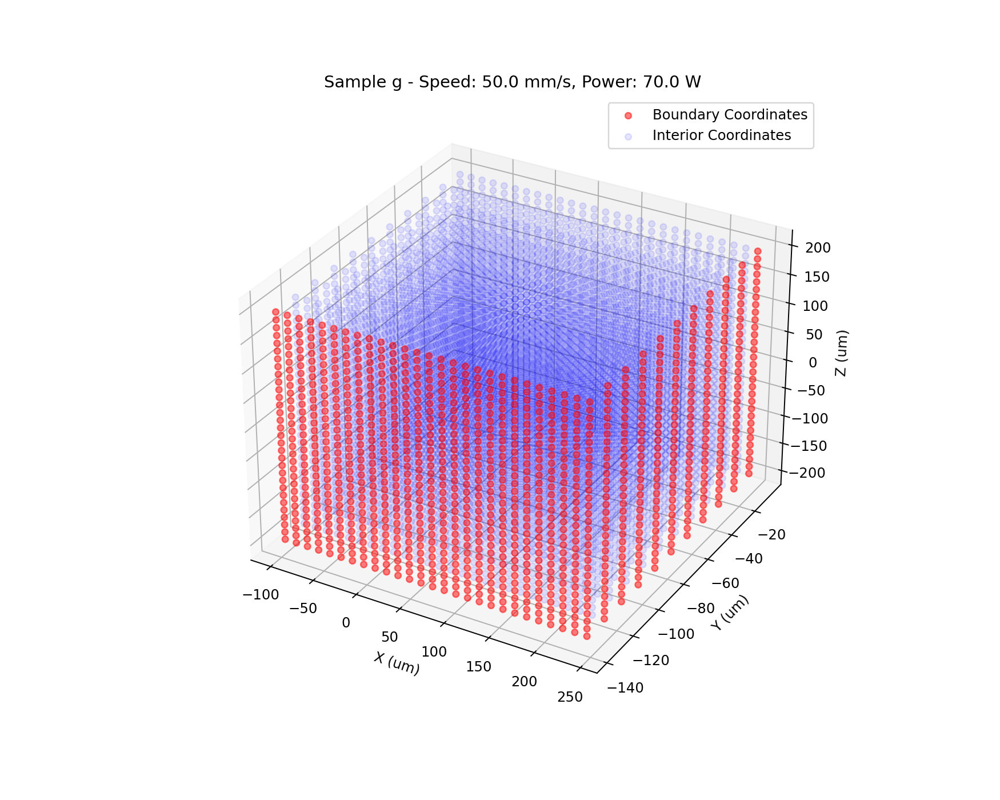

<IPython.core.display.Javascript object>


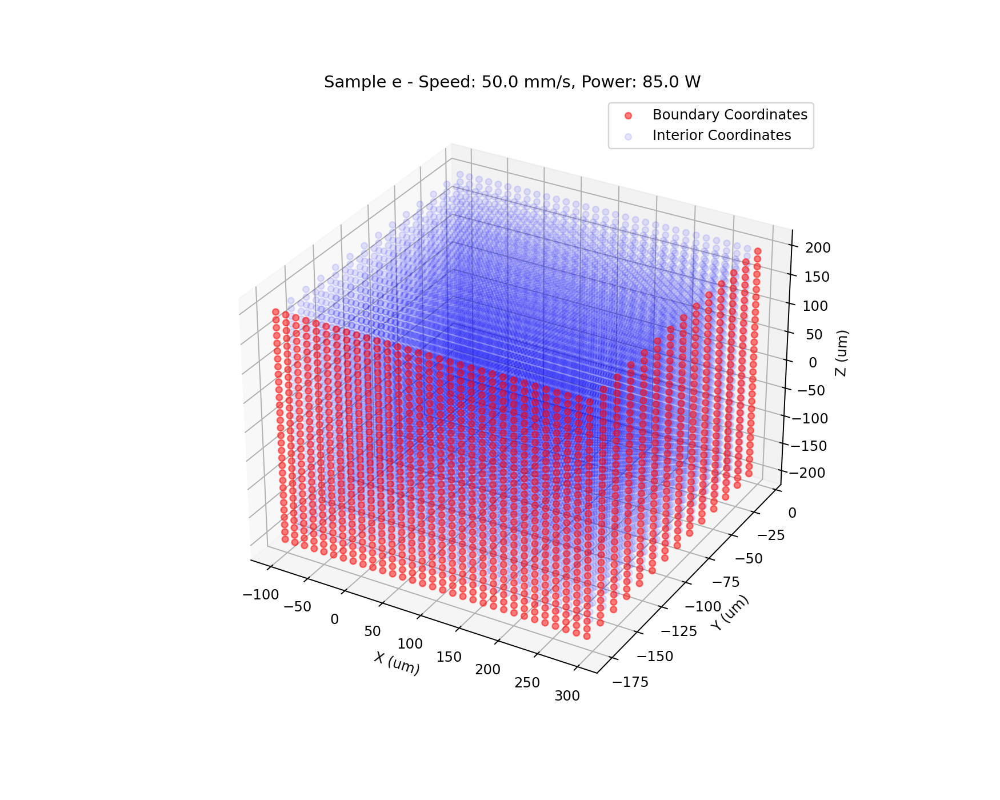

<IPython.core.display.Javascript object>


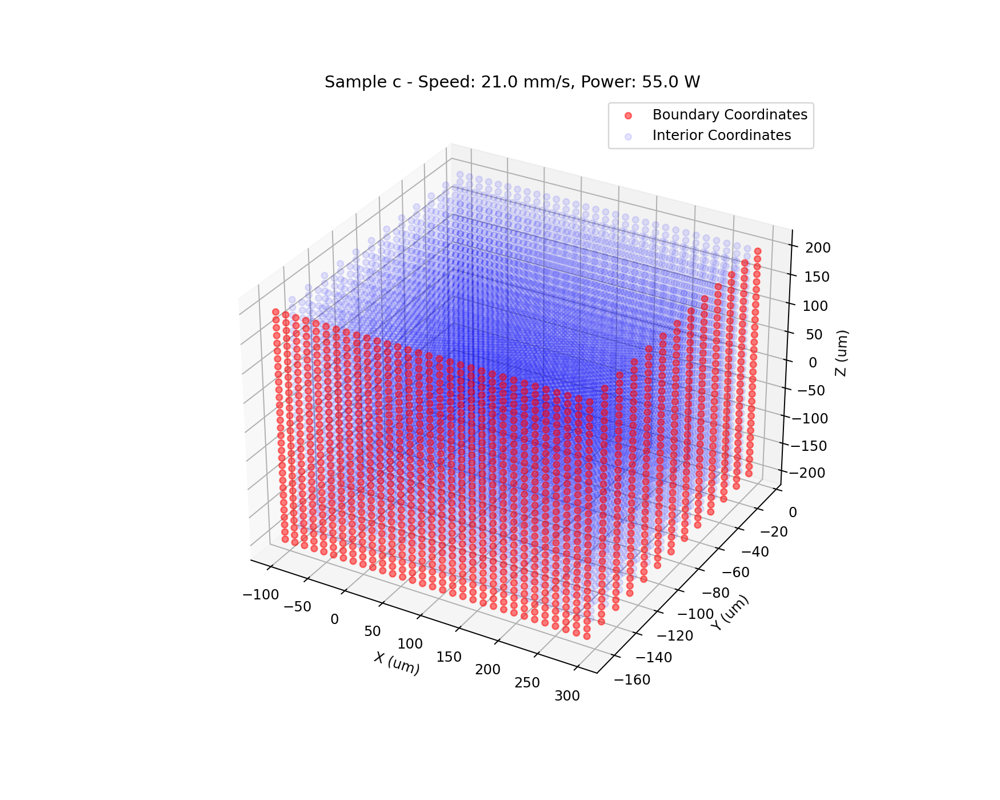

In [29]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Loop through each sample in the training DataLoader
for i, sample_data in enumerate(train_loader, 0):
    # Get the boundary and interior data for the current sample
    boundary_data = sample_data['boundary'][0]
    interior_data = sample_data['interior'][0]
    sample_name = sample_data['sample'][0]

    # Separate the coordinates and conditions
    boundary_coords = boundary_data[:, :3]
    boundary_conditions = boundary_data[:, 3:]

    interior_coords = interior_data[:, :3]
    interior_conditions = interior_data[:, 3:]

    # Unnormalize coordinates
    boundary_coords_unnorm = unnormalize_coordinates(boundary_coords, global_x_min, global_x_max, global_y_min, global_y_max, global_z_min, global_z_max)
    interior_coords_unnorm = unnormalize_coordinates(interior_coords, global_x_min, global_x_max, global_y_min, global_y_max, global_z_min, global_z_max)

    # Unnormalize conditions
    speed_condition = unnormalize_tensor(boundary_conditions[0, 0], global_speed_min, global_speed_max)
    power_condition = unnormalize_tensor(boundary_conditions[0, 1], global_power_min, global_power_max)

    # Create the 3D scatter plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Plot boundary coordinates in red
    ax.scatter(boundary_coords_unnorm[:, 0], boundary_coords_unnorm[:, 1], boundary_coords_unnorm[:, 2], c='r', marker='o', alpha=0.5, label='Boundary Coordinates')
    
    # Plot interior coordinates in blue
    ax.scatter(interior_coords_unnorm[:, 0], interior_coords_unnorm[:, 1], interior_coords_unnorm[:, 2], c='b', marker='o', alpha=0.1, label='Interior Coordinates')

    # Labels and title with conditions
    ax.set_xlabel('X (um)')
    ax.set_ylabel('Y (um)')
    ax.set_zlabel('Z (um)')
    ax.set_title(f'Sample {sample_name} - Speed: {speed_condition} mm/s, Power: {power_condition} W')
    ax.legend()

    plt.show()


In [30]:
# import matplotlib.pyplot as plt
# from mpl_toolkits.mplot3d import Axes3D

# # Loop through each batch in the training DataLoader
# for i, sample_data in enumerate(train_loader, 0):
#     # Get the boundary and interior data for the current sample
#     boundary_data = sample_data['boundary'][0]
#     interior_data = sample_data['interior'][0]
#     sample_name = sample_data['sample'][0]

#     # Separate the coordinates and conditions
#     boundary_coords = boundary_data[:, :3]
#     boundary_conditions = boundary_data[:, 3:]

#     interior_coords = interior_data[:, :3]
#     interior_conditions = interior_data[:, 3:]

#     # Extract conditions (no need to unnormalize here)
#     speed_condition = boundary_conditions[0, 0]
#     power_condition = boundary_conditions[0, 1]

#     # Create the 3D scatter plot
#     fig = plt.figure(figsize=(10, 8))
#     ax = fig.add_subplot(111, projection='3d')
    
#     # Plot boundary coordinates in red
#     ax.scatter(boundary_coords[:, 0], boundary_coords[:, 1], boundary_coords[:, 2], c='r', marker='o', alpha=0.5, label='Boundary Coordinates (Normalized)')
    
#     # Plot interior coordinates in blue
#     ax.scatter(interior_coords[:, 0], interior_coords[:, 1], interior_coords[:, 2], c='b', marker='o', alpha=0.1, label='Interior Coordinates (Normalized)')

#     # Labels and title with conditions
#     ax.set_xlabel('X (Normalized)')
#     ax.set_ylabel('Y (Normalized)')
#     ax.set_zlabel('Z (Normalized)')
#     ax.set_title(f'Sample {sample_name} - Speed: {speed_condition:.4f} (Normalized), Power: {power_condition:.4f} (Normalized)')
#     ax.legend()

#     plt.show()


In [31]:
# Initialize Neural Networks
temp_net = MultiResidualTempFieldNN(300.0).to(device).train()
#temp_net = torch.load('temp_net_trained_ADV_neg')
# Split the model across two GPUs
temp_net = torch.nn.DataParallel(temp_net, device_ids=[0, 1])
temp_net

DataParallel(
  (module): MultiResidualTempFieldNN(
    (layer1): Linear(in_features=5, out_features=3700, bias=True)
    (layer2): Linear(in_features=3700, out_features=3700, bias=True)
    (layer_out): Linear(in_features=3700, out_features=1, bias=True)
    (identity1): Linear(in_features=5, out_features=3700, bias=True)
    (identity2): Linear(in_features=3700, out_features=3700, bias=True)
  )
)

In [32]:
device

device(type='cuda')

In [33]:
from torch.optim import LBFGS, Adam

# Initialize Optimizers
params = list(temp_net.parameters())
optimizer_adam = Adam(params, lr=1e-3)
optimizer_lbfgs = LBFGS(params, line_search_fn="strong_wolfe")

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()

exclude_sample = all_samples[0]

print(f"Excluding sample: {exclude_sample} for validation.")

# Create Data Loaders
train_loader, val_loader = create_data_loader(exclude_sample, global_x_max, global_x_min, global_y_max, 
                                              global_y_min, global_z_max, global_z_min,
                                              sample_coordinates, sample_boundary_coordinates,
                                              sample_interior_coordinates, conditions_df, data_frames)

for i, sample_data in enumerate(train_loader, 0):
    boundary_data = sample_data['boundary'][0].to(device)
    interior_data = sample_data['interior'][0].to(device)
    sample_name = sample_data['sample'][0]
    
    # Get only the top surface
    interior_data = interior_data[interior_data[:, 1] == interior_data[:, 1].max(), :]

    # Unnormalize conditions
    speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
    power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

    # Unnormalize coordinates
    interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                     global_x_max, global_y_min, 
                                                     global_y_max, global_z_min, global_z_max)

    print(f"Processing sample: {sample_name}")

    # Set the coordinates to require gradient computation
    boundary_data.requires_grad = True
    interior_data.requires_grad = True

    # Compute heat source for the interior coordinates
    Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)  
    break

# Initialize iteration counter
iteration = 0

# Inner training loop
for epoch in range(num_epochs):  
    loss_epoch = 0.0
    
    # Select the optimizer based on the iteration
    if iteration < 10:
        optimizer = optimizer_adam
    else:
        optimizer = optimizer_lbfgs
          

    def closure():
        optimizer.zero_grad()
        # Initialize total loss
        total_loss = 0.0

        # Temperature Boundary Computations
        temp_at_boundary = temp_net(boundary_data)

        # Compute temperature gradients at the boundary
        temp_gradients_boundary = torch.autograd.grad(
            temp_at_boundary.sum(), boundary_data,
            create_graph=True, retain_graph=True
        )[0][:, :3]

        # Compute the adiabatic residual at the boundary
        adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
        total_loss += adiabatic_residual_boundary

        # Compute temperature residual at the boundary
        temp_residual_boundary = temp_at_boundary - T_amb
        temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
        total_loss += temp_residual_boundary_mean

        # Temperature Interior Computations
        temp_at_interior = temp_net(interior_data)

        # Compute temperature gradients at the interior
        temp_gradients_interior = torch.autograd.grad(
            temp_at_interior.sum(), interior_data,
            create_graph=True, retain_graph=True
        )[0]

        # Compute second partial derivatives (Laplacian components) for temperature at the interior
        temp_gradients_interior_second = torch.autograd.grad(
            temp_gradients_interior.sum(), interior_data,
            create_graph=True, retain_graph=True
        )[0][:, :3]

        # Compute the Laplacian of temperature at the interior
        temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

        # Compute the heat equation residual
        heat_equation_residual = (
            - rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
            + kappa * temp_laplacian_interior + Q_values_interior
        )

        # Compute the mean square of the heat equation residual
        heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

        # Add heat equation residual to the total loss
        total_loss += heat_equation_residual_mean

        # Add Penalty for Negative Temperatures
        negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
        negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

        # Add negative temperature penalty to the total loss
        total_loss += negative_temp_penalty_mean

        total_loss.backward()
        return total_loss

    # Backward pass and optimization using L-BFGS
    loss = optimizer.step(closure)
    loss_epoch += loss.item()
    
    # Increment the iteration counter
    iteration += 1

    #print(f"Epoch: {epoch}, Iteration: {iteration}, Sample: {sample_name}, Loss: {loss.item()}")


    print(f"DONE with Epoch: {epoch}, Loss EPOCH: {loss_epoch}")  
print(f"Finished LOOCV for excluded sample: {exclude_sample}")

print("Finished all LOOCV cycles.")


Excluding sample: a for validation.
Processing sample: f
DONE with Epoch: 0, Loss EPOCH: 316383456.0
DONE with Epoch: 1, Loss EPOCH: 316374944.0
DONE with Epoch: 2, Loss EPOCH: 316348672.0
DONE with Epoch: 3, Loss EPOCH: 316309184.0
DONE with Epoch: 4, Loss EPOCH: 316253376.0
DONE with Epoch: 5, Loss EPOCH: 316173632.0
DONE with Epoch: 6, Loss EPOCH: 316063072.0
DONE with Epoch: 7, Loss EPOCH: 315917952.0
DONE with Epoch: 8, Loss EPOCH: 315733856.0
DONE with Epoch: 9, Loss EPOCH: 315501856.0
DONE with Epoch: 10, Loss EPOCH: 315211744.0
DONE with Epoch: 11, Loss EPOCH: 68388920.0
DONE with Epoch: 12, Loss EPOCH: 7214540.5
DONE with Epoch: 13, Loss EPOCH: 1604389.0
DONE with Epoch: 14, Loss EPOCH: 792167.6875
DONE with Epoch: 15, Loss EPOCH: 383931.15625
DONE with Epoch: 16, Loss EPOCH: 194025.09375
DONE with Epoch: 17, Loss EPOCH: 121437.09375
DONE with Epoch: 18, Loss EPOCH: 75929.8359375
DONE with Epoch: 19, Loss EPOCH: 49488.234375
DONE with Epoch: 20, Loss EPOCH: 34152.52734375
DONE

DONE with Epoch: 162, Loss EPOCH: 62.96583938598633
DONE with Epoch: 163, Loss EPOCH: 61.81378173828125
DONE with Epoch: 164, Loss EPOCH: 61.1104736328125
DONE with Epoch: 165, Loss EPOCH: 60.45186996459961
DONE with Epoch: 166, Loss EPOCH: 59.597198486328125
DONE with Epoch: 167, Loss EPOCH: 58.79347229003906
DONE with Epoch: 168, Loss EPOCH: 58.24235916137695
DONE with Epoch: 169, Loss EPOCH: 57.63322448730469
DONE with Epoch: 170, Loss EPOCH: 56.975608825683594
DONE with Epoch: 171, Loss EPOCH: 56.272483825683594
DONE with Epoch: 172, Loss EPOCH: 55.65843963623047
DONE with Epoch: 173, Loss EPOCH: 54.91427230834961
DONE with Epoch: 174, Loss EPOCH: 54.41238784790039
DONE with Epoch: 175, Loss EPOCH: 53.96759796142578
DONE with Epoch: 176, Loss EPOCH: 53.39877700805664
DONE with Epoch: 177, Loss EPOCH: 52.55243682861328
DONE with Epoch: 178, Loss EPOCH: 52.01149368286133
DONE with Epoch: 179, Loss EPOCH: 51.33573913574219
DONE with Epoch: 180, Loss EPOCH: 50.77880859375
DONE with Epo

DONE with Epoch: 322, Loss EPOCH: 34.6251220703125
DONE with Epoch: 323, Loss EPOCH: 34.6251220703125
DONE with Epoch: 324, Loss EPOCH: 34.6251220703125
DONE with Epoch: 325, Loss EPOCH: 34.6251220703125
DONE with Epoch: 326, Loss EPOCH: 34.6251220703125
DONE with Epoch: 327, Loss EPOCH: 34.6251220703125
DONE with Epoch: 328, Loss EPOCH: 34.6251220703125
DONE with Epoch: 329, Loss EPOCH: 34.6251220703125
DONE with Epoch: 330, Loss EPOCH: 34.6251220703125
DONE with Epoch: 331, Loss EPOCH: 34.6251220703125
DONE with Epoch: 332, Loss EPOCH: 34.6251220703125
DONE with Epoch: 333, Loss EPOCH: 34.6251220703125
DONE with Epoch: 334, Loss EPOCH: 34.6251220703125
DONE with Epoch: 335, Loss EPOCH: 34.6251220703125
DONE with Epoch: 336, Loss EPOCH: 34.6251220703125
DONE with Epoch: 337, Loss EPOCH: 34.6251220703125
DONE with Epoch: 338, Loss EPOCH: 34.6251220703125
DONE with Epoch: 339, Loss EPOCH: 34.6251220703125
DONE with Epoch: 340, Loss EPOCH: 34.6251220703125
DONE with Epoch: 341, Loss EPOC

DONE with Epoch: 483, Loss EPOCH: 34.6251220703125
DONE with Epoch: 484, Loss EPOCH: 34.6251220703125
DONE with Epoch: 485, Loss EPOCH: 34.6251220703125
DONE with Epoch: 486, Loss EPOCH: 34.6251220703125
DONE with Epoch: 487, Loss EPOCH: 34.6251220703125
DONE with Epoch: 488, Loss EPOCH: 34.6251220703125
DONE with Epoch: 489, Loss EPOCH: 34.6251220703125
DONE with Epoch: 490, Loss EPOCH: 34.6251220703125
DONE with Epoch: 491, Loss EPOCH: 34.6251220703125
DONE with Epoch: 492, Loss EPOCH: 34.6251220703125
DONE with Epoch: 493, Loss EPOCH: 34.6251220703125
DONE with Epoch: 494, Loss EPOCH: 34.6251220703125
DONE with Epoch: 495, Loss EPOCH: 34.6251220703125
DONE with Epoch: 496, Loss EPOCH: 34.6251220703125
DONE with Epoch: 497, Loss EPOCH: 34.6251220703125
DONE with Epoch: 498, Loss EPOCH: 34.6251220703125
DONE with Epoch: 499, Loss EPOCH: 34.6251220703125
DONE with Epoch: 500, Loss EPOCH: 34.6251220703125
DONE with Epoch: 501, Loss EPOCH: 34.6251220703125
DONE with Epoch: 502, Loss EPOC

DONE with Epoch: 644, Loss EPOCH: 34.6251220703125
DONE with Epoch: 645, Loss EPOCH: 34.6251220703125
DONE with Epoch: 646, Loss EPOCH: 34.6251220703125
DONE with Epoch: 647, Loss EPOCH: 34.6251220703125
DONE with Epoch: 648, Loss EPOCH: 34.6251220703125
DONE with Epoch: 649, Loss EPOCH: 34.6251220703125
DONE with Epoch: 650, Loss EPOCH: 34.6251220703125
DONE with Epoch: 651, Loss EPOCH: 34.6251220703125
DONE with Epoch: 652, Loss EPOCH: 34.6251220703125
DONE with Epoch: 653, Loss EPOCH: 34.6251220703125
DONE with Epoch: 654, Loss EPOCH: 34.6251220703125
DONE with Epoch: 655, Loss EPOCH: 34.6251220703125
DONE with Epoch: 656, Loss EPOCH: 34.6251220703125
DONE with Epoch: 657, Loss EPOCH: 34.6251220703125
DONE with Epoch: 658, Loss EPOCH: 34.6251220703125
DONE with Epoch: 659, Loss EPOCH: 34.6251220703125
DONE with Epoch: 660, Loss EPOCH: 34.6251220703125
DONE with Epoch: 661, Loss EPOCH: 34.6251220703125
DONE with Epoch: 662, Loss EPOCH: 34.6251220703125
DONE with Epoch: 663, Loss EPOC

DONE with Epoch: 805, Loss EPOCH: 34.6251220703125
DONE with Epoch: 806, Loss EPOCH: 34.6251220703125
DONE with Epoch: 807, Loss EPOCH: 34.6251220703125
DONE with Epoch: 808, Loss EPOCH: 34.6251220703125
DONE with Epoch: 809, Loss EPOCH: 34.6251220703125
DONE with Epoch: 810, Loss EPOCH: 34.6251220703125
DONE with Epoch: 811, Loss EPOCH: 34.6251220703125
DONE with Epoch: 812, Loss EPOCH: 34.6251220703125
DONE with Epoch: 813, Loss EPOCH: 34.6251220703125
DONE with Epoch: 814, Loss EPOCH: 34.6251220703125
DONE with Epoch: 815, Loss EPOCH: 34.6251220703125
DONE with Epoch: 816, Loss EPOCH: 34.6251220703125
DONE with Epoch: 817, Loss EPOCH: 34.6251220703125
DONE with Epoch: 818, Loss EPOCH: 34.6251220703125
DONE with Epoch: 819, Loss EPOCH: 34.6251220703125
DONE with Epoch: 820, Loss EPOCH: 34.6251220703125
DONE with Epoch: 821, Loss EPOCH: 34.6251220703125
DONE with Epoch: 822, Loss EPOCH: 34.6251220703125
DONE with Epoch: 823, Loss EPOCH: 34.6251220703125
DONE with Epoch: 824, Loss EPOC

DONE with Epoch: 966, Loss EPOCH: 34.6251220703125
DONE with Epoch: 967, Loss EPOCH: 34.6251220703125
DONE with Epoch: 968, Loss EPOCH: 34.6251220703125
DONE with Epoch: 969, Loss EPOCH: 34.6251220703125
DONE with Epoch: 970, Loss EPOCH: 34.6251220703125
DONE with Epoch: 971, Loss EPOCH: 34.6251220703125
DONE with Epoch: 972, Loss EPOCH: 34.6251220703125
DONE with Epoch: 973, Loss EPOCH: 34.6251220703125
DONE with Epoch: 974, Loss EPOCH: 34.6251220703125
DONE with Epoch: 975, Loss EPOCH: 34.6251220703125
DONE with Epoch: 976, Loss EPOCH: 34.6251220703125
DONE with Epoch: 977, Loss EPOCH: 34.6251220703125
DONE with Epoch: 978, Loss EPOCH: 34.6251220703125
DONE with Epoch: 979, Loss EPOCH: 34.6251220703125
DONE with Epoch: 980, Loss EPOCH: 34.6251220703125
DONE with Epoch: 981, Loss EPOCH: 34.6251220703125
DONE with Epoch: 982, Loss EPOCH: 34.6251220703125
DONE with Epoch: 983, Loss EPOCH: 34.6251220703125
DONE with Epoch: 984, Loss EPOCH: 34.6251220703125
DONE with Epoch: 985, Loss EPOC

DONE with Epoch: 1125, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1126, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1127, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1128, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1129, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1130, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1131, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1132, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1133, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1134, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1135, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1136, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1137, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1138, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1139, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1140, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1141, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1142, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1143, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 1283, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1284, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1285, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1286, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1287, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1288, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1289, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1290, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1291, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1292, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1293, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1294, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1295, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1296, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1297, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1298, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1299, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1300, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1301, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 1441, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1442, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1443, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1444, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1445, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1446, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1447, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1448, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1449, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1450, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1451, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1452, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1453, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1454, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1455, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1456, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1457, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1458, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1459, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 1599, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1600, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1601, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1602, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1603, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1604, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1605, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1606, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1607, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1608, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1609, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1610, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1611, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1612, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1613, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1614, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1615, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1616, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1617, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 1757, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1758, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1759, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1760, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1761, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1762, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1763, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1764, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1765, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1766, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1767, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1768, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1769, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1770, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1771, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1772, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1773, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1774, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1775, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 1915, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1916, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1917, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1918, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1919, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1920, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1921, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1922, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1923, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1924, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1925, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1926, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1927, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1928, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1929, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1930, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1931, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1932, Loss EPOCH: 34.6251220703125
DONE with Epoch: 1933, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 2073, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2074, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2075, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2076, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2077, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2078, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2079, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2080, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2081, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2082, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2083, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2084, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2085, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2086, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2087, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2088, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2089, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2090, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2091, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 2231, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2232, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2233, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2234, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2235, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2236, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2237, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2238, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2239, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2240, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2241, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2242, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2243, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2244, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2245, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2246, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2247, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2248, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2249, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 2389, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2390, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2391, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2392, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2393, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2394, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2395, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2396, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2397, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2398, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2399, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2400, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2401, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2402, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2403, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2404, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2405, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2406, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2407, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 2547, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2548, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2549, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2550, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2551, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2552, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2553, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2554, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2555, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2556, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2557, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2558, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2559, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2560, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2561, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2562, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2563, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2564, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2565, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 2705, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2706, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2707, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2708, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2709, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2710, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2711, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2712, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2713, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2714, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2715, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2716, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2717, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2718, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2719, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2720, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2721, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2722, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2723, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 2863, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2864, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2865, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2866, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2867, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2868, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2869, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2870, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2871, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2872, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2873, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2874, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2875, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2876, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2877, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2878, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2879, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2880, Loss EPOCH: 34.6251220703125
DONE with Epoch: 2881, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3021, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3022, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3023, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3024, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3025, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3026, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3027, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3028, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3029, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3030, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3031, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3032, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3033, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3034, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3035, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3036, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3037, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3038, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3039, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3179, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3180, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3181, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3182, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3183, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3184, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3185, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3186, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3187, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3188, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3189, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3190, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3191, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3192, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3193, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3194, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3195, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3196, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3197, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3337, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3338, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3339, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3340, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3341, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3342, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3343, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3344, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3345, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3346, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3347, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3348, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3349, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3350, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3351, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3352, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3353, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3354, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3355, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3495, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3496, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3497, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3498, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3499, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3500, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3501, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3502, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3503, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3504, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3505, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3506, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3507, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3508, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3509, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3510, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3511, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3512, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3513, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3653, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3654, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3655, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3656, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3657, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3658, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3659, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3660, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3661, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3662, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3663, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3664, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3665, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3666, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3667, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3668, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3669, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3670, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3671, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3811, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3812, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3813, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3814, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3815, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3816, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3817, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3818, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3819, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3820, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3821, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3822, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3823, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3824, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3825, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3826, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3827, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3828, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3829, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 3969, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3970, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3971, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3972, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3973, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3974, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3975, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3976, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3977, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3978, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3979, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3980, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3981, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3982, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3983, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3984, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3985, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3986, Loss EPOCH: 34.6251220703125
DONE with Epoch: 3987, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 4127, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4128, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4129, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4130, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4131, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4132, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4133, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4134, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4135, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4136, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4137, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4138, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4139, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4140, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4141, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4142, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4143, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4144, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4145, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 4285, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4286, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4287, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4288, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4289, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4290, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4291, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4292, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4293, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4294, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4295, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4296, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4297, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4298, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4299, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4300, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4301, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4302, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4303, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 4443, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4444, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4445, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4446, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4447, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4448, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4449, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4450, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4451, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4452, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4453, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4454, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4455, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4456, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4457, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4458, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4459, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4460, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4461, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 4601, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4602, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4603, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4604, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4605, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4606, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4607, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4608, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4609, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4610, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4611, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4612, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4613, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4614, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4615, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4616, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4617, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4618, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4619, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 4759, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4760, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4761, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4762, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4763, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4764, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4765, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4766, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4767, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4768, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4769, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4770, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4771, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4772, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4773, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4774, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4775, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4776, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4777, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 4917, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4918, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4919, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4920, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4921, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4922, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4923, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4924, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4925, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4926, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4927, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4928, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4929, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4930, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4931, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4932, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4933, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4934, Loss EPOCH: 34.6251220703125
DONE with Epoch: 4935, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 5075, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5076, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5077, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5078, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5079, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5080, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5081, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5082, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5083, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5084, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5085, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5086, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5087, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5088, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5089, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5090, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5091, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5092, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5093, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 5233, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5234, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5235, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5236, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5237, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5238, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5239, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5240, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5241, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5242, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5243, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5244, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5245, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5246, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5247, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5248, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5249, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5250, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5251, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 5391, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5392, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5393, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5394, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5395, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5396, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5397, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5398, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5399, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5400, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5401, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5402, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5403, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5404, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5405, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5406, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5407, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5408, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5409, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 5549, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5550, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5551, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5552, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5553, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5554, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5555, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5556, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5557, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5558, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5559, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5560, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5561, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5562, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5563, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5564, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5565, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5566, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5567, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 5707, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5708, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5709, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5710, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5711, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5712, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5713, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5714, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5715, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5716, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5717, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5718, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5719, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5720, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5721, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5722, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5723, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5724, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5725, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 5865, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5866, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5867, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5868, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5869, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5870, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5871, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5872, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5873, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5874, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5875, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5876, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5877, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5878, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5879, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5880, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5881, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5882, Loss EPOCH: 34.6251220703125
DONE with Epoch: 5883, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6023, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6024, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6025, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6026, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6027, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6028, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6029, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6030, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6031, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6032, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6033, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6034, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6035, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6036, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6037, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6038, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6039, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6040, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6041, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6181, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6182, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6183, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6184, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6185, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6186, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6187, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6188, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6189, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6190, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6191, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6192, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6193, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6194, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6195, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6196, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6197, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6198, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6199, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6339, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6340, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6341, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6342, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6343, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6344, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6345, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6346, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6347, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6348, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6349, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6350, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6351, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6352, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6353, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6354, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6355, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6356, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6357, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6497, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6498, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6499, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6500, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6501, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6502, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6503, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6504, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6505, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6506, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6507, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6508, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6509, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6510, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6511, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6512, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6513, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6514, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6515, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6655, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6656, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6657, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6658, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6659, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6660, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6661, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6662, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6663, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6664, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6665, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6666, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6667, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6668, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6669, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6670, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6671, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6672, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6673, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6813, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6814, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6815, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6816, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6817, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6818, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6819, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6820, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6821, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6822, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6823, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6824, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6825, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6826, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6827, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6828, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6829, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6830, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6831, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 6971, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6972, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6973, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6974, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6975, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6976, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6977, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6978, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6979, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6980, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6981, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6982, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6983, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6984, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6985, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6986, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6987, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6988, Loss EPOCH: 34.6251220703125
DONE with Epoch: 6989, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 7129, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7130, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7131, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7132, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7133, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7134, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7135, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7136, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7137, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7138, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7139, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7140, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7141, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7142, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7143, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7144, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7145, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7146, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7147, Loss EPOCH: 34.6251220703125
DONE with Ep

DONE with Epoch: 7287, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7288, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7289, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7290, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7291, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7292, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7293, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7294, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7295, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7296, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7297, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7298, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7299, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7300, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7301, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7302, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7303, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7304, Loss EPOCH: 34.6251220703125
DONE with Epoch: 7305, Loss EPOCH: 34.6251220703125
DONE with Ep

KeyboardInterrupt: 

In [34]:
# temp_net = torch.load('temp_net_trained_all_positive').module
# temp_net
temp_net = temp_net.module
 

In [35]:
interior_data

tensor([[-1.0000,  1.0000, -1.0000, -0.3793, -1.0000],
        [-0.9333,  1.0000, -1.0000, -0.3793, -1.0000],
        [-0.8667,  1.0000, -1.0000, -0.3793, -1.0000],
        ...,
        [ 0.6667,  1.0000,  1.0000, -0.3793, -1.0000],
        [ 0.7333,  1.0000,  1.0000, -0.3793, -1.0000],
        [ 0.8000,  1.0000,  1.0000, -0.3793, -1.0000]], device='cuda:0',
       requires_grad=True)

In [42]:
for i, sample_data in enumerate(train_loader, 0):
    boundary_data = sample_data['boundary'][0].to(device)
    interior_data = sample_data['interior'][0].to(device)
    sample_name = sample_data['sample'][0]

    # Unnormalize conditions
    speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
    power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

    # Unnormalize coordinates
    interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                     global_x_max, global_y_min, 
                                                     global_y_max, global_z_min, global_z_max)

    print(f"Processing sample: {sample_name}")

    # Set the coordinates to require gradient computation
    boundary_data.requires_grad = True
    interior_data.requires_grad = True

    # Compute heat source for the interior coordinates
    Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)  
    break

Processing sample: f


In [43]:
total_loss = 0.0

temp_net = temp_net.cpu()
# Temperature Boundary Computations
temp_at_boundary = temp_net(boundary_data.cpu())

# Compute temperature gradients at the boundary
temp_gradients_boundary = torch.autograd.grad(
    temp_at_boundary.sum(), boundary_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the adiabatic residual at the boundary
adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
total_loss += adiabatic_residual_boundary

# Compute temperature residual at the boundary
temp_residual_boundary = temp_at_boundary - T_amb
temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
total_loss += temp_residual_boundary_mean

# Temperature Interior Computations
temp_at_interior = temp_net(interior_data.cpu())

# Compute temperature gradients at the interior
temp_gradients_interior = torch.autograd.grad(
    temp_at_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0]

# Compute second partial derivatives (Laplacian components) for temperature at the interior
temp_gradients_interior_second = torch.autograd.grad(
    temp_gradients_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the Laplacian of temperature at the interior
temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

# Compute the heat equation residual
heat_equation_residual = (
    - rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
    + kappa * temp_laplacian_interior - Q_values_interior
)

# Compute the mean square of the heat equation residual
heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

# Add heat equation residual to the total loss
total_loss += heat_equation_residual_mean

# Add Penalty for Negative Temperatures
negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

# Add negative temperature penalty to the total loss
total_loss += negative_temp_penalty_mean
# Print each component of the total loss for debugging and analysis
print("Component-wise Loss Contributions:")
print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
print(f"Total Loss: {total_loss.item():.6f}")


Component-wise Loss Contributions:
Adiabatic Residual at Boundary: 22.816313
Temperature Residual at Boundary: 2.055815
Heat Equation Residual: 108572600.000000
Negative Temperature Penalty: 0.000000
Total Loss: 108572624.000000


In [44]:
inner = temp_gradients_interior[:, 0] * speed.flatten()
inner.shape, inner.max()

(torch.Size([10416]),
 tensor(34487.7227, device='cuda:0', grad_fn=<MaxBackward1>))

In [45]:
temp_gradients_interior[:, 0].shape

torch.Size([10416])

In [46]:
device = 'cpu'

In [47]:
boundary_data = sample_data['boundary'][0].to(device)
interior_data = sample_data['interior'][0].to(device)
sample_name = sample_data['sample'][0]

# Unnormalize conditions
speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

# Unnormalize coordinates
interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                 global_x_max, global_y_min, 
                                                 global_y_max, global_z_min, global_z_max)

#print(f"Processing sample: {sample_name}")

# Set the coordinates to require gradient computation
boundary_data.requires_grad = True
interior_data.requires_grad = True

# Compute heat source for the interior coordinates
Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

temp = temp_net(interior_data)
temp.max(), speed, power, Q_values_interior.max()

(tensor(2745.9460, grad_fn=<MaxBackward1>),
 tensor([30., 30., 30.,  ..., 30., 30., 30.]),
 tensor([55., 55., 55.,  ..., 55., 55., 55.]),
 tensor(76741.0781))

In [48]:
temp.mean()

tensor(188.9299, grad_fn=<MeanBackward0>)

<IPython.core.display.Javascript object>


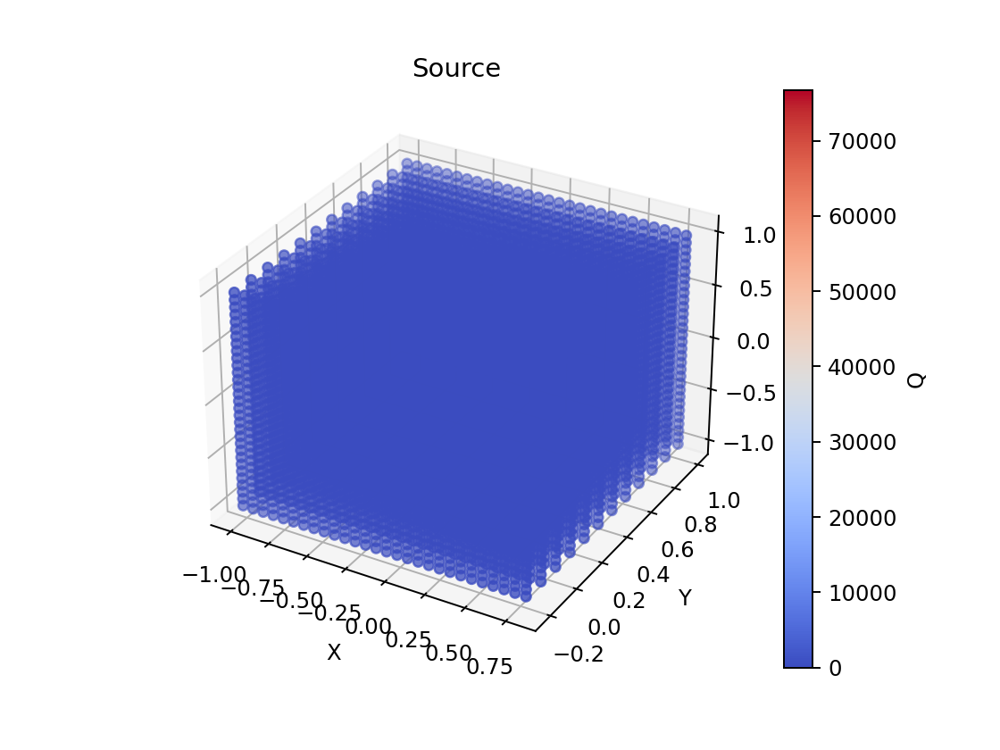

In [49]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=Q_values_interior.cpu().detach().numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Q')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Source')

plt.show()

<IPython.core.display.Javascript object>


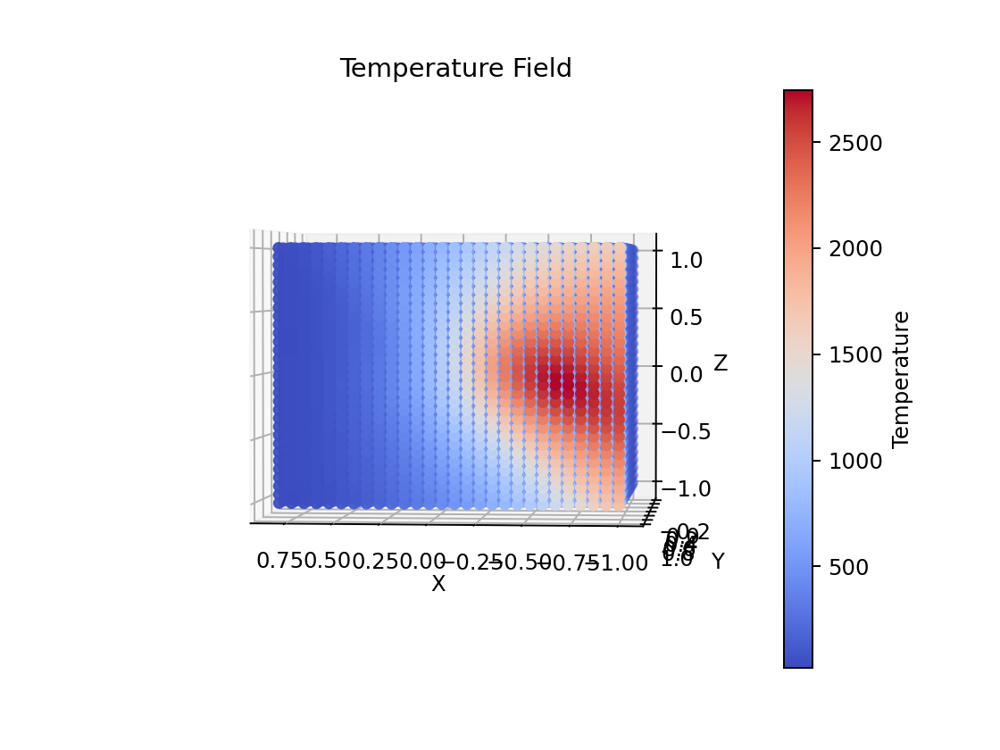

In [50]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=temp.cpu().detach().numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field')

plt.show()

<IPython.core.display.Javascript object>


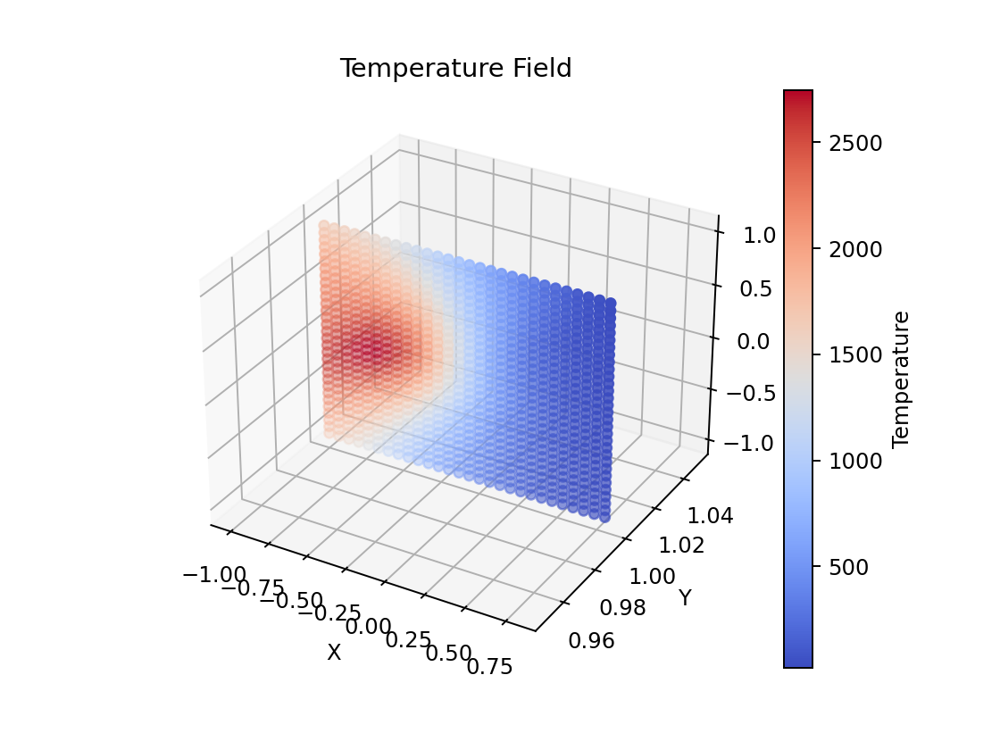

In [51]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
surface_data = interior_data[interior_data[:,1] == interior_data[:,1].max()]
temp_surface = temp_net(surface_data.cpu())

x, y, z = surface_data[:, 0].cpu().detach().numpy(), surface_data[:, 1].cpu().detach().numpy(), surface_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=temp_surface.cpu().detach().view(-1).numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field')

plt.show()

In [52]:
surface_data

tensor([[-1.0000,  1.0000, -1.0000, -0.3793, -1.0000],
        [-0.9333,  1.0000, -1.0000, -0.3793, -1.0000],
        [-0.8667,  1.0000, -1.0000, -0.3793, -1.0000],
        ...,
        [ 0.6667,  1.0000,  1.0000, -0.3793, -1.0000],
        [ 0.7333,  1.0000,  1.0000, -0.3793, -1.0000],
        [ 0.8000,  1.0000,  1.0000, -0.3793, -1.0000]],
       grad_fn=<IndexBackward0>)

In [53]:
%matplotlib inline

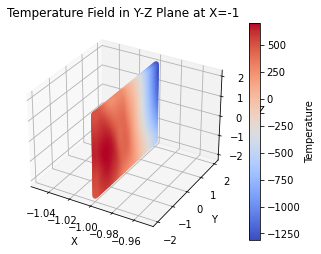

In [57]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Generate Y-Z grid
y_values = np.linspace(-2, 2, 100)
z_values = np.linspace(-2, 2, 100)
y_grid, z_grid = np.meshgrid(y_values, z_values)

# Prepare the data for the neural network
x_fixed = - np.ones_like(y_grid)  # X-coordinate is fixed at 1
norm_speed = np.full_like(y_grid, interior_data[-2,0].detach())  # Normalized speed
norm_power = np.full_like(y_grid, interior_data[-1,0].detach())  # Normalized power

# Reshape the data and concatenate all columns
nn_input = np.stack([x_fixed.ravel(), y_grid.ravel(), z_grid.ravel(), norm_speed.ravel(), norm_power.ravel()], axis=1)

# Convert to PyTorch tensor
nn_input_tensor = torch.tensor(nn_input, dtype=torch.float32)

# Evaluate the temperature field using the neural network
with torch.no_grad():
    temp_field = temp_net(nn_input_tensor).cpu().numpy()

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(nn_input[:, 0], nn_input[:, 1], nn_input[:, 2], c=temp_field.ravel(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field in Y-Z Plane at X=-1')

plt.show()


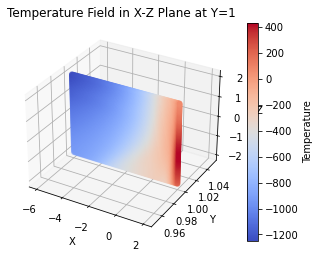

In [58]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# Generate X-Z grid
x_values = np.linspace(-6, 2, 100)
z_values = np.linspace(-2, 2, 100)
x_grid, z_grid = np.meshgrid(x_values, z_values)

# Prepare the data for the neural network
y_fixed = np.ones_like(x_grid)  # Y-coordinate is fixed at 1
norm_speed = np.full_like(x_grid, interior_data[-2,0].detach())  # Normalized speed
norm_power = np.full_like(x_grid, interior_data[-1,0].detach())  # Normalized power

# Reshape the data and concatenate all columns
nn_input = np.stack([x_grid.ravel(), y_fixed.ravel(), z_grid.ravel(), norm_speed.ravel(), norm_power.ravel()], axis=1)

# Convert to PyTorch tensor
nn_input_tensor = torch.tensor(nn_input, dtype=torch.float32)

# Evaluate the temperature field using the neural network
with torch.no_grad():
    temp_field = temp_net(nn_input_tensor).cpu().numpy()

# Create a 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(nn_input[:, 0], nn_input[:, 1], nn_input[:, 2], c=temp_field.ravel(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field in X-Z Plane at Y=1')

plt.show()


In [ ]:
torch.save(temp_net, 'temp_net_trained_ADV_neg')

In [ ]:
nn_input

In [ ]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot interior_data points
x_interior, y_interior, z_interior = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()
scatter_interior = ax.scatter(x_interior, y_interior, z_interior, c=temp.cpu().detach().numpy(), cmap='coolwarm')

# Plot boundary_data points in red
x_boundary, y_boundary, z_boundary = boundary_data[:, 0].cpu().detach().numpy(), boundary_data[:, 1].cpu().detach().numpy(), boundary_data[:, 2].cpu().detach().numpy()
scatter_boundary = ax.scatter(x_boundary, y_boundary, z_boundary, c='red', label='Boundary Data')

# Add a colorbar to indicate temperature values for the interior points
cbar = fig.colorbar(scatter_interior, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

# Label the axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Add title
plt.title('Temperature Field')

# Add legend
ax.legend()

# Show the plot
plt.show()


In [ ]:
# Find the maximum Y value
y_max = np.max(y)

# Create a mask for the points that are on the plane y = y_max
mask_y_max = (y == y_max)

# Filter the x, y, z coordinates and the adv values
x_filtered = x[mask_y_max]
y_filtered = y[mask_y_max]
z_filtered = z[mask_y_max]

adv = rho * Cp * temp_gradients_interior[:, 0].cpu() * speed.flatten().cpu()
adv_filtered = adv.cpu().detach().numpy()[mask_y_max]

# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Only plot the points that lie on the plane y = y_max
scatter = ax.scatter(x_filtered, y_filtered, z_filtered, c=adv_filtered, cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Q')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Advection term on the plane y = y_max')

plt.show()

print("Maximum value of advection term:", np.max(adv_filtered))


In [ ]:
# Find the maximum Y value
y_max = np.max(y)

# Create a mask for the points that are on the plane y = y_max
mask_y_max = (y == y_max)

# Filter the x, y, z coordinates and the diff values
x_filtered = x[mask_y_max]
y_filtered = y[mask_y_max]
z_filtered = z[mask_y_max]
diff = kappa * temp_laplacian_interior
diff_filtered = diff.cpu().detach().numpy()[mask_y_max]

# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Only plot the points that lie on the plane y = y_max
scatter = ax.scatter(x_filtered, y_filtered, z_filtered, c=diff_filtered, cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Q')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Diffusion term on the plane y = y_max')

plt.show()

print("Maximum value of diffusion term:", np.max(diff_filtered))


In [ ]:
# Compute the heat equation residual
heat_equation_residual = (
    rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
    - kappa * temp_laplacian_interior - Q_values_interior
)

In [ ]:
from torch.optim import LBFGS, Adam

# Initialize Neural Networks
temp_net = TempFieldNN().to(device).train()
fluid_net = FluidFlowNN().to(device).train()

# Initialize L-BFGS Optimizer
params = list(temp_net.parameters()) + list(fluid_net.parameters())
optimizer = Adam(params, lr=1e-3) #LBFGS(params, line_search_fn="strong_wolfe")

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()

# Leave-One-Out Cross-Validation
for exclude_sample in all_samples:
    print(f"Excluding sample: {exclude_sample} for validation.")

    # Create Data Loaders
    train_loader, val_loader = create_data_loader(exclude_sample, global_x_max, global_x_min, global_y_max, 
                                                  global_y_min, global_z_max, global_z_min,
                                                  sample_coordinates, sample_boundary_coordinates,
                                                  sample_interior_coordinates, conditions_df, data_frames)
    
    # Inner training loop
    for epoch in range(num_epochs):  
        loss_epoch = 0.0
        for i, sample_data in enumerate(train_loader, 0):
            boundary_data = sample_data['boundary'][0].to(device)
            interior_data = sample_data['interior'][0].to(device)
            sample_name = sample_data['sample'][0]
            
            # Unnormalize conditions
            speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
            power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)
            
            # Unnormalize coordinates
            interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                             global_x_max, global_y_min, 
                                                             global_y_max, global_z_min, global_z_max)

            print(f"Processing sample: {sample_name}")

            # Set the coordinates to require gradient computation
            boundary_data.requires_grad = True
            interior_data.requires_grad = True
            
            # Compute heat source for the interior coordinates
            Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

            def closure():
                optimizer.zero_grad()
                # Initialize total loss
                total_loss = 0.0

                # Temperature Boundary Computations
                temp_at_boundary = temp_net(boundary_data)

                # Compute temperature gradients at the boundary
                temp_gradients_boundary = torch.autograd.grad(
                    temp_at_boundary.sum(), boundary_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the adiabatic residual at the boundary
                adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
                total_loss += adiabatic_residual_boundary

                # Compute temperature residual at the boundary
                temp_residual_boundary = temp_at_boundary - T_amb
                temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
                total_loss += temp_residual_boundary_mean

                # Fluid Boundary Computations
                fluid_at_boundary = fluid_net(boundary_data)

                # Compute fluid residual at the boundary
                fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
                total_loss += fluid_residual_boundary

                # Temperature Interior Computations
                temp_at_interior = temp_net(interior_data)

                # Compute temperature gradients at the interior
                temp_gradients_interior = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0]

                # Compute second partial derivatives (Laplacian components) for temperature at the interior
                temp_gradients_interior_second = torch.autograd.grad(
                    temp_gradients_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the Laplacian of temperature at the interior
                temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

                # Fluid Interior Computations
                fluid_at_interior = fluid_net(interior_data)

                # Find Minimum Y-Coordinate for Surface (Still Negative)
                interior_coordinates = interior_data[:, :3]
                min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

                # Create Mask for Surface (Smallest Y but Still Negative)
                mask_surface = (interior_coordinates[:, 1] == min_y_surface)

                # Create Mask for Temperature Greater Than Melting Point
                mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

                # Combine Both Masks
                mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

                # Compute X-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_x = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Z-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_z = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Temperature Gradients at Surface and Above Melting Point
                temp_gradients_surface_melt = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Marangoni Constraint 1
                if fluid_gradients_x.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_x or temp_gradients_surface_melt is empty for constraint_marangoni_1, setting its contribution to zero.")
                    constraint_marangoni_1_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_x.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
                    constraint_marangoni_1_mean_squared = torch.mean(constraint_marangoni_1 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_1_mean_squared

                # Marangoni Constraint 2
                if fluid_gradients_z.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_z or temp_gradients_surface_melt is empty for constraint_marangoni_2, setting its contribution to zero.")
                    constraint_marangoni_2_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_z.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
                    constraint_marangoni_2_mean_squared = torch.mean(constraint_marangoni_2 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_2_mean_squared

                # No Vertical Fluid Velocity at the Surface
                total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

                # No Fluid Flow Outside Liquid Phase
                mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

                # Compute Fluid Divergence
                fluid_gradients_vx = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 0]

                fluid_gradients_vy = torch.autograd.grad(
                    fluid_at_interior[:, 1].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 1]

                fluid_gradients_vz = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 2]

                # Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
                fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

                # Enforce Zero Divergence for Fluid
                total_loss += torch.mean(fluid_divergence ** 2)

                # Compute inner product between temperature gradients and fluid velocity in the interior
                inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

                # Compute the heat equation residual
                heat_equation_residual = (
                    rho * Cp * inner_product_temp_gradients_fluid_velocity
                    - rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
                    - kappa * temp_laplacian_interior - Q_values_interior
                )

                # Compute the mean square of the heat equation residual
                heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

                # Add heat equation residual to the total loss
                total_loss += heat_equation_residual_mean

                # Add Penalty for Negative Temperatures
                negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
                negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

                # Add negative temperature penalty to the total loss
                total_loss += negative_temp_penalty_mean
                
                total_loss.backward()
                
                # Print each component of the total loss for debugging and analysis
#                 print("Component-wise Loss Contributions:")
#                 print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
#                 print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
#                 print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
#                 print(f"Marangoni Constraint 1: {constraint_marangoni_1_mean_squared.item():.6f}")
#                 print(f"Marangoni Constraint 2: {constraint_marangoni_2_mean_squared.item():.6f}")
#                 print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
#                 print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
#                 print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
#                 print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
#                 print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
#                 print(f"Total Loss: {total_loss.item():.6f}")
                
                
                return total_loss

            # Backward pass and optimization using L-BFGS
            loss = optimizer.step(closure)
            loss_epoch += loss.item()
            
            #print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
            print("-------"*8)
            
        print(f"DONE with Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}, Loss EPOCH: {loss_epoch}")    
    print(f"Finished LOOCV for excluded sample: {exclude_sample}")

print("Finished all LOOCV cycles.")


In [ ]:
# Initialize L-BFGS Optimizer
params = list(temp_net.parameters()) + list(fluid_net.parameters())
optimizer = LBFGS(params, line_search_fn="strong_wolfe", max_iter=2500)

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()

# Leave-One-Out Cross-Validation
for exclude_sample in all_samples:
    print(f"Excluding sample: {exclude_sample} for validation.")

    # Create Data Loaders
    train_loader, val_loader = create_data_loader(exclude_sample, global_x_max, global_x_min, global_y_max, 
                                                  global_y_min, global_z_max, global_z_min,
                                                  sample_coordinates, sample_boundary_coordinates,
                                                  sample_interior_coordinates, conditions_df, data_frames)
    
    # Inner training loop
    for epoch in range(num_epochs):  
        loss_epoch = 0.0
        for i, sample_data in enumerate(train_loader, 0):
            boundary_data = sample_data['boundary'][0].to(device)
            interior_data = sample_data['interior'][0].to(device)
            sample_name = sample_data['sample'][0]
            
            # Unnormalize conditions
            speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
            power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)
            
            # Unnormalize coordinates
            interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                             global_x_max, global_y_min, 
                                                             global_y_max, global_z_min, global_z_max)

            print(f"Processing sample: {sample_name}")

            # Set the coordinates to require gradient computation
            boundary_data.requires_grad = True
            interior_data.requires_grad = True
            
            # Compute heat source for the interior coordinates
            Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

            def closure():
                optimizer.zero_grad()
                # Initialize total loss
                total_loss = 0.0

                # Temperature Boundary Computations
                temp_at_boundary = temp_net(boundary_data)

                # Compute temperature gradients at the boundary
                temp_gradients_boundary = torch.autograd.grad(
                    temp_at_boundary.sum(), boundary_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the adiabatic residual at the boundary
                adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
                total_loss += adiabatic_residual_boundary

                # Compute temperature residual at the boundary
                temp_residual_boundary = temp_at_boundary - T_amb
                temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
                total_loss += temp_residual_boundary_mean

                # Fluid Boundary Computations
                fluid_at_boundary = fluid_net(boundary_data)

                # Compute fluid residual at the boundary
                fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
                total_loss += fluid_residual_boundary

                # Temperature Interior Computations
                temp_at_interior = temp_net(interior_data)

                # Compute temperature gradients at the interior
                temp_gradients_interior = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0]

                # Compute second partial derivatives (Laplacian components) for temperature at the interior
                temp_gradients_interior_second = torch.autograd.grad(
                    temp_gradients_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, :3]

                # Compute the Laplacian of temperature at the interior
                temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

                # Fluid Interior Computations
                fluid_at_interior = fluid_net(interior_data)

                # Find Minimum Y-Coordinate for Surface (Still Negative)
                interior_coordinates = interior_data[:, :3]
                min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

                # Create Mask for Surface (Smallest Y but Still Negative)
                mask_surface = (interior_coordinates[:, 1] == min_y_surface)

                # Create Mask for Temperature Greater Than Melting Point
                mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

                # Combine Both Masks
                mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

                # Compute X-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_x = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Z-Component Fluid Gradients at Surface and Above Melting Point
                fluid_gradients_z = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Compute Temperature Gradients at Surface and Above Melting Point
                temp_gradients_surface_melt = torch.autograd.grad(
                    temp_at_interior.sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][mask_surface_and_above_melt, :3]

                # Marangoni Constraint 1
                if fluid_gradients_x.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_x or temp_gradients_surface_melt is empty for constraint_marangoni_1, setting its contribution to zero.")
                    constraint_marangoni_1_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_x.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
                    constraint_marangoni_1_mean_squared = torch.mean(constraint_marangoni_1 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_1_mean_squared

                # Marangoni Constraint 2
                if fluid_gradients_z.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
                    # print("Warning: Either fluid_gradients_z or temp_gradients_surface_melt is empty for constraint_marangoni_2, setting its contribution to zero.")
                    constraint_marangoni_2_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_z.device)  # Make sure it's on the same device
                else:
                    constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
                    constraint_marangoni_2_mean_squared = torch.mean(constraint_marangoni_2 ** 2)
                # Add to total loss
                total_loss += constraint_marangoni_2_mean_squared

                # No Vertical Fluid Velocity at the Surface
                total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

                # No Fluid Flow Outside Liquid Phase
                mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
                total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

                # Compute Fluid Divergence
                fluid_gradients_vx = torch.autograd.grad(
                    fluid_at_interior[:, 0].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 0]

                fluid_gradients_vy = torch.autograd.grad(
                    fluid_at_interior[:, 1].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 1]

                fluid_gradients_vz = torch.autograd.grad(
                    fluid_at_interior[:, 2].sum(), interior_data,
                    create_graph=True, retain_graph=True
                )[0][:, 2]

                # Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
                fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

                # Enforce Zero Divergence for Fluid
                total_loss += torch.mean(fluid_divergence ** 2)

                # Compute inner product between temperature gradients and fluid velocity in the interior
                inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

                # Compute the heat equation residual
                heat_equation_residual = (
                    rho * Cp * inner_product_temp_gradients_fluid_velocity
                    + rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
                    - kappa * temp_laplacian_interior - Q_values_interior
                )

                # Compute the mean square of the heat equation residual
                heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

                # Add heat equation residual to the total loss
                total_loss += heat_equation_residual_mean

                # Add Penalty for Negative Temperatures
                negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
                negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

                # Add negative temperature penalty to the total loss
                total_loss += negative_temp_penalty_mean
                
                total_loss.backward()
                
                # Print each component of the total loss for debugging and analysis
                print("Component-wise Loss Contributions:")
                print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
                print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
                print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
                print(f"Marangoni Constraint 1: {constraint_marangoni_1_mean_squared.item():.6f}")
                print(f"Marangoni Constraint 2: {constraint_marangoni_2_mean_squared.item():.6f}")
                print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
                print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
                print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
                print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
                print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
                print(f"Total Loss: {total_loss.item():.6f}")
                
                
                return total_loss

            # Backward pass and optimization using L-BFGS
            loss = optimizer.step(closure)
            loss_epoch += loss.item()
            
            print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
            print("-------"*8)
            
        print(f"DONE with Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}, Loss EPOCH: {loss_epoch}")    
    print(f"Finished LOOCV for excluded sample: {exclude_sample}")

print("Finished all LOOCV cycles.")


In [ ]:
# Initialize L-BFGS Optimizer
params = list(temp_net.parameters()) + list(fluid_net.parameters())
optimizer = LBFGS(params, line_search_fn="strong_wolfe", max_iter=2500)

# Loss function
criterion = nn.MSELoss()

# List of all sample names
all_samples = conditions_df['Sample Name'].tolist()


boundary_data = sample_data['boundary'][0].to(device)
interior_data = sample_data['interior'][0].to(device)
sample_name = sample_data['sample'][0]

# Unnormalize conditions
speed = unnormalize_tensor(interior_data[:, 3], global_speed_min, global_speed_max)
power = unnormalize_tensor(interior_data[:, 4], global_power_min, global_power_max)

# Unnormalize coordinates
interior_coords_unnorm = unnormalize_coordinates(interior_data[:, :3], global_x_min, 
                                                 global_x_max, global_y_min, 
                                                 global_y_max, global_z_min, global_z_max)

print(f"Processing sample: {sample_name}")

# Set the coordinates to require gradient computation
boundary_data.requires_grad = True
interior_data.requires_grad = True

# Compute heat source for the interior coordinates
Q_values_interior = heat_source(interior_coords_unnorm / 1000, power, spot_radius, eta)     

def closure():
    optimizer.zero_grad()
    # Initialize total loss
    total_loss = 0.0

    # Temperature Boundary Computations
    temp_at_boundary = temp_net(boundary_data)

    # Compute temperature gradients at the boundary
    temp_gradients_boundary = torch.autograd.grad(
        temp_at_boundary.sum(), boundary_data,
        create_graph=True, retain_graph=True
    )[0][:, :3]

    # Compute the adiabatic residual at the boundary
    adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
    total_loss += adiabatic_residual_boundary

    # Compute temperature residual at the boundary
    temp_residual_boundary = temp_at_boundary - T_amb
    temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
    total_loss += temp_residual_boundary_mean

    # Fluid Boundary Computations
    fluid_at_boundary = fluid_net(boundary_data)

    # Compute fluid residual at the boundary
    fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
    total_loss += fluid_residual_boundary

    # Temperature Interior Computations
    temp_at_interior = temp_net(interior_data)

    # Compute temperature gradients at the interior
    temp_gradients_interior = torch.autograd.grad(
        temp_at_interior.sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0]

    # Compute second partial derivatives (Laplacian components) for temperature at the interior
    temp_gradients_interior_second = torch.autograd.grad(
        temp_gradients_interior.sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, :3]

    # Compute the Laplacian of temperature at the interior
    temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

    # Fluid Interior Computations
    fluid_at_interior = fluid_net(interior_data)

    # Find Minimum Y-Coordinate for Surface (Still Negative)
    interior_coordinates = interior_data[:, :3]
    min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

    # Create Mask for Surface (Smallest Y but Still Negative)
    mask_surface = (interior_coordinates[:, 1] == min_y_surface)

    # Create Mask for Temperature Greater Than Melting Point
    mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

    # Combine Both Masks
    mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

    # Compute X-Component Fluid Gradients at Surface and Above Melting Point
    fluid_gradients_x = torch.autograd.grad(
        fluid_at_interior[:, 0].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][mask_surface_and_above_melt, :3]

    # Compute Z-Component Fluid Gradients at Surface and Above Melting Point
    fluid_gradients_z = torch.autograd.grad(
        fluid_at_interior[:, 2].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][mask_surface_and_above_melt, :3]

    # Compute Temperature Gradients at Surface and Above Melting Point
    temp_gradients_surface_melt = torch.autograd.grad(
        temp_at_interior.sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][mask_surface_and_above_melt, :3]

    # Marangoni Constraint 1
    if fluid_gradients_x.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
        # print("Warning: Either fluid_gradients_x or temp_gradients_surface_melt is empty for constraint_marangoni_1, setting its contribution to zero.")
        constraint_marangoni_1_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_x.device)  # Make sure it's on the same device
    else:
        constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
        constraint_marangoni_1_mean_squared = torch.mean(constraint_marangoni_1 ** 2)
    # Add to total loss
    total_loss += constraint_marangoni_1_mean_squared

    # Marangoni Constraint 2
    if fluid_gradients_z.nelement() == 0 or temp_gradients_surface_melt.nelement() == 0:
        # print("Warning: Either fluid_gradients_z or temp_gradients_surface_melt is empty for constraint_marangoni_2, setting its contribution to zero.")
        constraint_marangoni_2_mean_squared = torch.tensor(0.0, requires_grad=True).to(fluid_gradients_z.device)  # Make sure it's on the same device
    else:
        constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
        constraint_marangoni_2_mean_squared = torch.mean(constraint_marangoni_2 ** 2)
    # Add to total loss
    total_loss += constraint_marangoni_2_mean_squared

    # No Vertical Fluid Velocity at the Surface
    total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

    # No Fluid Flow Outside Liquid Phase
    mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
    total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
    total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
    total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

    # Compute Fluid Divergence
    fluid_gradients_vx = torch.autograd.grad(
        fluid_at_interior[:, 0].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, 0]

    fluid_gradients_vy = torch.autograd.grad(
        fluid_at_interior[:, 1].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, 1]

    fluid_gradients_vz = torch.autograd.grad(
        fluid_at_interior[:, 2].sum(), interior_data,
        create_graph=True, retain_graph=True
    )[0][:, 2]

    # Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
    fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

    # Enforce Zero Divergence for Fluid
    total_loss += torch.mean(fluid_divergence ** 2)

    # Compute inner product between temperature gradients and fluid velocity in the interior
    inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

    # Compute the heat equation residual
    heat_equation_residual = (
        rho * Cp * inner_product_temp_gradients_fluid_velocity
        + rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
        - kappa * temp_laplacian_interior - Q_values_interior
    )

    # Compute the mean square of the heat equation residual
    heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

    # Add heat equation residual to the total loss
    total_loss += heat_equation_residual_mean

    # Add Penalty for Negative Temperatures
    negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
    negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

    # Add negative temperature penalty to the total loss
    total_loss += negative_temp_penalty_mean

    total_loss.backward()

    # Print each component of the total loss for debugging and analysis
    print("Component-wise Loss Contributions:")
    print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
    print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
    print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
    print(f"Marangoni Constraint 1: {constraint_marangoni_1_mean_squared.item():.6f}")
    print(f"Marangoni Constraint 2: {constraint_marangoni_2_mean_squared.item():.6f}")
    print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
    print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
    print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
    print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
    print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
    print(f"Total Loss: {total_loss.item():.6f}")


    return total_loss

# Backward pass and optimization using L-BFGS
loss = optimizer.step(closure)
loss_epoch += loss.item()

print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
print("-------"*8)



In [ ]:
# Backward pass and optimization using L-BFGS
loss = optimizer.step(closure)
loss_epoch += loss.item()

print(f"Epoch: {epoch}, Sample: {sample_name}, Loss: {loss.item()}")
print("-------"*8)

In [ ]:
# Temperature Boundary Computations
temp = temp_net(interior_data)
temp.max()

In [ ]:
fluid_at_interior = fluid_net(interior_data)
fluid_at_interior

In [ ]:
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()
u, v, w = fluid_at_interior[:, 0].cpu().detach().numpy(), fluid_at_interior[:, 1].cpu().detach().numpy(), fluid_at_interior[:, 2].cpu().detach().numpy()

# Create a 3D quiver plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

ax.quiver(x, y, z, u, v, w, length=0.1, normalize=True)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Fluid Velocity Field')

plt.show()

In [ ]:
# Create a 3D scatter plot for temperature
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
x, y, z = interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy()

scatter = ax.scatter(x, y, z, c=temp.cpu().detach().numpy(), cmap='coolwarm')

# Add a colorbar to indicate temperature values
cbar = fig.colorbar(scatter, ax=ax, orientation='vertical')
cbar.set_label('Temperature')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
plt.title('Temperature Field')

plt.show()

In [ ]:
optimizer.zero_grad()
# Initialize total loss
total_loss = 0.0

# Temperature Boundary Computations
temp_at_boundary = temp_net(boundary_data)

# Compute temperature gradients at the boundary
temp_gradients_boundary = torch.autograd.grad(
    temp_at_boundary.sum(), boundary_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the adiabatic residual at the boundary
adiabatic_residual_boundary = torch.mean(temp_gradients_boundary ** 2)
total_loss += adiabatic_residual_boundary

# Compute temperature residual at the boundary
temp_residual_boundary = temp_at_boundary - T_amb
temp_residual_boundary_mean = torch.mean(temp_residual_boundary ** 2)
total_loss += temp_residual_boundary_mean

# Fluid Boundary Computations
fluid_at_boundary = fluid_net(boundary_data)

# Compute fluid residual at the boundary
fluid_residual_boundary = torch.mean(fluid_at_boundary ** 2)
total_loss += fluid_residual_boundary

# Temperature Interior Computations
temp_at_interior = temp_net(interior_data)

# Compute temperature gradients at the interior
temp_gradients_interior = torch.autograd.grad(
    temp_at_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0]

# Compute second partial derivatives (Laplacian components) for temperature at the interior
temp_gradients_interior_second = torch.autograd.grad(
    temp_gradients_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, :3]

# Compute the Laplacian of temperature at the interior
temp_laplacian_interior = temp_gradients_interior_second.sum(dim=1)

# Fluid Interior Computations
fluid_at_interior = fluid_net(interior_data)

# Find Minimum Y-Coordinate for Surface (Still Negative)
interior_coordinates = interior_data[:, :3]
min_y_surface = interior_coordinates[:, 1][interior_coordinates[:, 1] < 0].max()

# Create Mask for Surface (Smallest Y but Still Negative)
mask_surface = (interior_coordinates[:, 1] == min_y_surface)

# Create Mask for Temperature Greater Than Melting Point
mask_temp_above_melt = (temp_at_interior > T_melt).view(-1)

# Combine Both Masks
mask_surface_and_above_melt = mask_surface.view(-1) & mask_temp_above_melt.view(-1)

# Compute X-Component Fluid Gradients at Surface and Above Melting Point
fluid_gradients_x = torch.autograd.grad(
    fluid_at_interior[:, 0].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][mask_surface_and_above_melt, :3]

# Compute Z-Component Fluid Gradients at Surface and Above Melting Point
fluid_gradients_z = torch.autograd.grad(
    fluid_at_interior[:, 2].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][mask_surface_and_above_melt, :3]

# Compute Temperature Gradients at Surface and Above Melting Point
temp_gradients_surface_melt = torch.autograd.grad(
    temp_at_interior.sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][mask_surface_and_above_melt, :3]

# Marangoni Constraint 1
constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt
total_loss += torch.mean(constraint_marangoni_1 ** 2)

# Marangoni Constraint 2
constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
total_loss += torch.mean(constraint_marangoni_2 ** 2)

# No Vertical Fluid Velocity at the Surface
total_loss += torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2)

# No Fluid Flow Outside Liquid Phase
mask_temp_below_melt = ~mask_temp_above_melt.view(-1)
total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2)
total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 1] ** 2)
total_loss += torch.mean(fluid_at_interior[mask_temp_below_melt][:, 2] ** 2)

# Compute Fluid Divergence
fluid_gradients_vx = torch.autograd.grad(
    fluid_at_interior[:, 0].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, 0]

fluid_gradients_vy = torch.autograd.grad(
    fluid_at_interior[:, 1].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, 1]

fluid_gradients_vz = torch.autograd.grad(
    fluid_at_interior[:, 2].sum(), interior_data,
    create_graph=True, retain_graph=True
)[0][:, 2]

# Compute Divergence: div(V) = dVx/dx + dVy/dy + dVz/dz
fluid_divergence = fluid_gradients_vx + fluid_gradients_vy + fluid_gradients_vz

# Enforce Zero Divergence for Fluid
total_loss += torch.mean(fluid_divergence ** 2)

# Compute inner product between temperature gradients and fluid velocity in the interior
inner_product_temp_gradients_fluid_velocity = (temp_gradients_interior[:, :3] * fluid_at_interior).sum(dim=1)

# Compute the heat equation residual
heat_equation_residual = (
    rho * Cp * inner_product_temp_gradients_fluid_velocity
    + rho * Cp * temp_gradients_interior[:, 0] * speed.flatten()
    - kappa * temp_laplacian_interior - Q_values_interior
)

# Compute the mean square of the heat equation residual
heat_equation_residual_mean = torch.mean(heat_equation_residual ** 2)

# Add heat equation residual to the total loss
total_loss += heat_equation_residual_mean

# Add Penalty for Negative Temperatures
negative_temp_penalty = torch.nn.ReLU()(-temp_at_interior)
negative_temp_penalty_mean = torch.mean(negative_temp_penalty ** 2)

# Add negative temperature penalty to the total loss
total_loss += negative_temp_penalty_mean

# Print each component of the total loss for debugging and analysis
print("Component-wise Loss Contributions:")
print(f"Adiabatic Residual at Boundary: {adiabatic_residual_boundary.item():.6f}")
print(f"Temperature Residual at Boundary: {temp_residual_boundary_mean.item():.6f}")
print(f"Fluid Residual at Boundary: {fluid_residual_boundary.item():.6f}")
print(f"Marangoni Constraint 1: {torch.mean(constraint_marangoni_1 ** 2).item():.6f}")
print(f"Marangoni Constraint 2: {torch.mean(constraint_marangoni_2 ** 2).item():.6f}")
print(f"Vertical Fluid Velocity at Surface: {torch.mean(fluid_at_interior[mask_surface][:, 1] ** 2).item():.6f}")
print(f"Fluid Flow Outside Liquid Phase: {torch.mean(fluid_at_interior[mask_temp_below_melt][:, 0] ** 2).item():.6f}")
print(f"Fluid Divergence: {torch.mean(fluid_divergence ** 2).item():.6f}")
print(f"Heat Equation Residual: {heat_equation_residual_mean.item():.6f}")
print(f"Negative Temperature Penalty: {negative_temp_penalty_mean.item():.6f}")
print(f"Total Loss: {total_loss.item():.6f}")



In [ ]:
temp_at_interior

In [ ]:
constraint_marangoni_1 = mu * fluid_gradients_x[:, 1] - temp_gradients_surface_melt[:, 0] * dgamma_dt

constraint_marangoni_2 = mu * fluid_gradients_z[:, 1] - temp_gradients_surface_melt[:, 2] * dgamma_dt
constraint_marangoni_1, constraint_marangoni_2

In [ ]:
constraint_marangoni_1.nelement() == 0

In [ ]:
# Create the 3D scatter plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
sc = ax.scatter(interior_data[:, 0].cpu().detach().numpy(), interior_data[:, 1].cpu().detach().numpy(), interior_data[:, 2].cpu().detach().numpy(), c=Q_values_interior.cpu().detach().numpy(), cmap='viridis')

# Add color bar
cbar = plt.colorbar(sc)

# Label axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
cbar.set_label('Q_values_interior', rotation=270, labelpad=15)

# Show the plot
plt.show()

In [ ]:
boundary_data